In [1]:
import pandas as pd
import numpy as np
import pickle
import datetime
import os
import datetime
import matplotlib.pyplot as plt
from matplotlib.pyplot import figure
import matplotlib.image as mpimg
import math
import time
import sys
from sklearn.metrics import r2_score
import rasterio 
import copy
import mpl_toolkits.mplot3d 
from mpl_toolkits.mplot3d import Axes3D
import random
from matplotlib import ticker
from sklearn import manifold
from mpl_toolkits.axes_grid1 import make_axes_locatable

sys.path.append('./Functions/')
from STANDARD_FUNCTIONS import read_pickle, write_pickle, display_png
from DATA_ANALYSIS_FUNCTIONS import standardize_df, normalize_df, remove_outliers, split_train_val_test, count_class_var

def count_class_var(df, class_var):
    for i in np.sort(df[class_var].unique()):
        print(class_var, i, ':', df.Cluster[df.Cluster==i].count())
        
# for making heat mapts
# # https://blog.jovian.ai/interesting-heatmaps-using-python-folium-ee41b118a996

# IMPORT DATAFRAMES AND TAKE SQRT OF AGB

In [2]:
# below datasets are created from 08_Sampleing.py
destination_costa_rica = '/mnt/locutus/remotesensing/r62/costa_rica/FINAL_SAMPLED_COSTA_RICA.pkl'
destination_panama = '/mnt/locutus/remotesensing/r62/panama/FINAL_SAMPLED_PANAMA.pkl'

df_CR = pd.read_pickle(destination_costa_rica)
df_P = pd.read_pickle(destination_panama)

print(' COSTA RICA SHAPE:', df_CR.shape, '\n', 'PANAMA SHAPE:', df_P.shape)
print(' COSTA RICA Date min/max:', 'min:', df_CR.Date.min(), 'max:', df_CR.Date.max())
print(' PANAMA Date min/max:', 'min:', df_P.Date.min(), 'max:', df_P.Date.max())

df = pd.concat([df_CR, df_P])

 COSTA RICA SHAPE: (959644, 36) 
 PANAMA SHAPE: (1000290, 36)
 COSTA RICA Date min/max: min: 2019-04-20 11:28:24 max: 2022-05-10 01:50:08
 PANAMA Date min/max: min: 2019-04-19 22:14:24 max: 2022-05-28 05:24:32


In [3]:
df['Sqrt_AGB'] = np.sqrt(df.AGB)

rh_list = ['RH98', 'RH90', 'RH80', 'RH70', 'RH60', 'RH50', 'RH40', 'RH30', 'RH20']

RHvals = df[rh_list]
RHvals = RHvals.loc[(RHvals<0).any(axis=1)]
prop_neg_rh_vals = round(RHvals.shape[0]/df.shape[0], 2)
print()
print('RH VALUES ARE NEGATIVE', str(prop_neg_rh_vals) + '%', 'OF THE TIME')
print()

bands_list = ['B2', 'B3', 'B4', 'B5', 'B6', 'B7', 'B8', 'B8A', 'B11', 'B12']

# this is redundant but here it is!
for band in bands_list:
    df = df[df[band] != 0]

df = df.drop_duplicates(subset=['Shot_Number'])

df_temp = standardize_df(df, bands_list)
df_temp = remove_outliers(df_temp, bands_list, 3)
mask = np.isin(np.array(df.Shot_Number), np.array(df_temp.Shot_Number))
df = df[mask]

del df_temp
del mask

# Create NDVI for later
df['NDVI'] = (df['B8'] - df['B4'])/(df['B8'] + df['B4'])

print('SHAPE OF df:', df.shape)
print()
print(df.columns)
print()
df.head()


RH VALUES ARE NEGATIVE 0.39% OF THE TIME

SHAPE OF df: (1903479, 38)

Index(['Latitude', 'Longitude', 'AGB', 'AGB_SE', 'Time', 'Plant_Type',
       'Leaf_Flag', 'Quality_4A', 'Degrade', 'RH98', 'RH90', 'RH80', 'RH70',
       'RH60', 'RH50', 'RH40', 'RH30', 'RH20', 'TX', 'Lowest_Elev',
       'Sensitivity', 'BeamID', 'Quality_2A', 'Shot_Number', 'Date', 'B2',
       'B3', 'B4', 'B5', 'B6', 'B7', 'B8', 'B8A', 'B11', 'B12', 'Month_Number',
       'Sqrt_AGB', 'NDVI'],
      dtype='object')



,Latitude,Longitude,AGB,AGB_SE,Time,Plant_Type,Leaf_Flag,Quality_4A,Degrade,RH98,...,B5,B6,B7,B8,B8A,B11,B12,Month_Number,Sqrt_AGB,NDVI
0,9.759272,-84.538254,222.231873,13.086902,40994904.0,2.0,255.0,1.0,0.0,24.34,...,955.0,3208.0,4339.0,4157.0,4742.0,1755.0,599.0,0,14.907444,0.807784
1,9.756342,-84.540398,185.935165,13.085482,40994904.0,2.0,1.0,1.0,0.0,24.90,...,945.0,3105.0,4311.0,4278.0,4768.0,1967.0,702.0,0,13.635805,0.803922
2,9.730911,-84.545555,55.536255,13.095191,40994904.0,2.0,255.0,1.0,0.0,7.41,...,1161.0,3032.0,3601.0,3548.0,4013.0,1901.0,753.0,0,7.452265,0.777110
4,9.713778,-84.558128,0.693881,13.113668,40994904.0,2.0,255.0,1.0,0.0,7.15,...,1509.0,2936.0,3579.0,3205.0,4096.0,3327.0,1705.0,0,0.832995,0.546441
5,9.773395,-84.507149,205.924500,13.090748,40994904.0,2.0,255.0,1.0,0.0,20.00,...,775.0,2972.0,4120.0,3924.0,4580.0,1630.0,554.0,0,14.350070,0.802895


# EXPLORATORY

In [4]:
tx_lowest_diff = np.abs(np.array(df.TX) - np.array(df.Lowest_Elev))
print()
print('ON AVERAGE THE DIFFERENCE BETWEEN TANDEM-X AND LOWEST ELEVATION IS:', round(tx_lowest_diff.mean(), 2), 'METERS')
print()
print('THE DATES OF THE GEDI DATA RANGE ANYWHERE FROM:', df.Date.min(), 'TO', df.Date.max())
days_between = df.Date.max() - df.Date.min()
print('THIS EQUATES TO', days_between.days, 'DAYS')
print()
print('ON AVERAGE THE DIFFERENCE BETWEEN THE TOP OF THE CANOPY AND TANDEM-X IS:', 
      round(np.abs(np.array(df.TX) - (np.array(df.Lowest_Elev)+ np.array(df.RH98))).mean(), 2), 'METERS')
print()


ON AVERAGE THE DIFFERENCE BETWEEN TANDEM-X AND LOWEST ELEVATION IS: 12.71 METERS

THE DATES OF THE GEDI DATA RANGE ANYWHERE FROM: 2019-04-19 22:14:24 TO 2022-05-28 05:24:32
THIS EQUATES TO 1134 DAYS

ON AVERAGE THE DIFFERENCE BETWEEN THE TOP OF THE CANOPY AND TANDEM-X IS: 13.62 METERS



In [5]:
# Normalize the bands data and sqrt of AGB
# df = normalize_df(df, bands_list, convert=True)
# df = normalize_df(df, ['Sqrt_AGB'], convert=True)

days_between = df.Date.max() - df.Date.min()

S2_range = []
for x in range(days_between.days + 1): # the S2 data contains 1,138 days in its range
    S2_range.append(datetime.timedelta(days=x)+datetime.datetime(2019, 4, 20)) # year month day

interval = (S2_range[-1] - S2_range[0])/df.Month_Number.max()
print()
print('Each interval is a time span of:', interval)
grouped_cr = df.groupby(pd.Grouper(key='Date', freq=interval))
number_groups = len(grouped_cr.groups)
print('There are', number_groups, 'time groups or intervals.')
print()



Each interval is a time span of: 31 days, 12:00:00
There are 37 time groups or intervals.



In [9]:
# interval = (S2_range[-1] - S2_range[0])/(number_S2_months - 1) # 41-1 representing the s2 time groupings
# print('For ' + country_name + ' each interval is a time span of: ' + str(interval), flush=True)

# I need the min date to be 4/2/2019  and the max date to be 6/1/22 
# so I will add 2 fake obs to the df knowing they will be 
# eliminated later on as the coordinates won't line up

grouped_cr = df.groupby(pd.Grouper(key='Date', freq=interval))
# print('For ' + country_name + ' there are ' + str(len(grouped_cr.groups)) + ' groups ', flush=True)
number_groups = len(grouped_cr.groups)

x_axis_dates = []
for i in grouped_cr:
    x_axis_dates.append(i[0])

In [10]:
# Group statistics
averages = df.groupby(pd.Grouper(key='Date', freq=interval)).mean()
stds = df.groupby(pd.Grouper(key='Date', freq=interval)).std()
counts = df.groupby(pd.Grouper(key='Date', freq=interval)).count()

THE LARGEST GROUP BY COUNT AND THE MOST REPRESENTATIVE OF THE TIME SERIES IS GROUP: 32


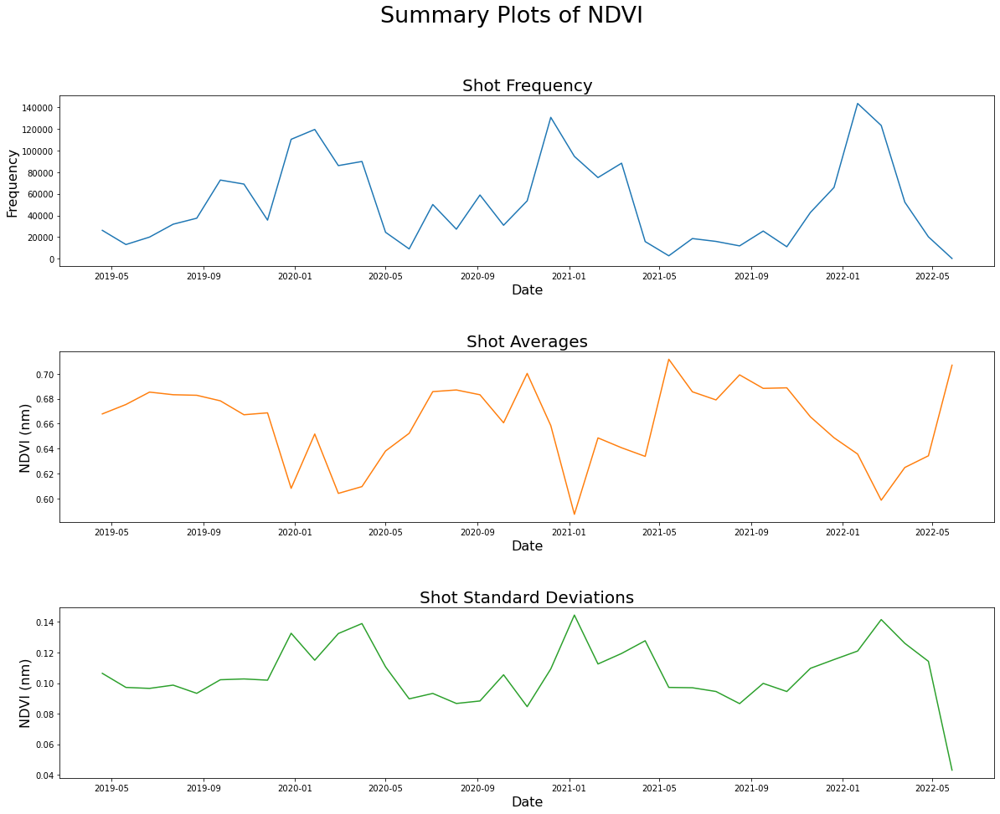

In [11]:

var_to_plot = 'NDVI'

if var_to_plot == 'AGB':
    units = ' (Mg/Ha)'
elif var_to_plot == 'NDVI':
    units = ' (nm)'
    
fig, axs = plt.subplots(3, 1, figsize=(20, 15))
fig.suptitle('Summary Plots of {}'.format(var_to_plot), fontsize= 27)
plt.subplots_adjust(hspace=0.5)
xaxis = np.array([i for i in range(len(counts))])

axs[0].plot(x_axis_dates, np.array(counts[var_to_plot]))
axs[0].set_title('Shot Frequency', fontsize= 20)
axs[0].set_xlabel('Date', fontsize= 16)
axs[0].set_ylabel('Frequency', fontsize= 16)

axs[1].plot(x_axis_dates, np.array(averages[var_to_plot]), 'tab:orange')
axs[1].set_title('Shot Averages', fontsize= 20)
axs[1].set_xlabel('Date', fontsize= 16)
axs[1].set_ylabel(str(var_to_plot) + units, fontsize= 16)

axs[2].plot(x_axis_dates, np.array(stds[var_to_plot]), 'tab:green')
axs[2].set_title('Shot Standard Deviations', fontsize= 20)
axs[2].set_xlabel('Date', fontsize= 16)
axs[2].set_ylabel(str(var_to_plot) + units, fontsize= 16);

print('THE LARGEST GROUP BY COUNT AND THE MOST REPRESENTATIVE OF THE TIME SERIES IS GROUP:', np.argmax(counts.Month_Number))

In [12]:
print()
print(np.array(counts['NDVI']))
print()
print('Month_Number', df.Month_Number.unique()[-1], 'NEEDS TO BE REMOVED AS SHOWN ABOVE')
print()


[ 26224  13125  19996  31884  37430  72674  68955  35669 110293 119408
  86021  89831  24430   9057  50092  27280  58881  30928  53474 130588
  94529  74973  88245  15854   2723  18637  16007  11881  25556  11062
  42732  65839 143417 123082  52246  20229    227]

Month_Number 36 NEEDS TO BE REMOVED AS SHOWN ABOVE



In [13]:
df = df[df.Month_Number != 36]

# Based on the above plots I choose 10 as the month most representative

### CREATE TIME VARIABLES

### Euclidean Coordinates

In [14]:
# NDVI = (B8-B4)/(B8+B4)

# x = 360/364
# multiplly the days by x to fit the form 0 to 360 just like degrees
# then multiply the resulting days by np.pi / 180 to get days_radians
# get x and y componenets
# NDVI*np.cos(days_radians) = xcomp
# NDVI*np.sin(days_radians) = ycomp

df = df.sort_values(by='Date')

day_of_year = []

for i in df.Date:
    day_of_year.append(i.timetuple().tm_yday)
    
# ndvi = np.array(df.B8 - df.B4)/(df.B8 + df.B4)
day_of_year = np.array(day_of_year)
day_of_year = day_of_year-1
day_of_year = day_of_year*(360/364)
radians = day_of_year*(np.pi / 180)
df['Radians'] = radians

df_vis = copy.deepcopy(df)
for col in bands_list:
    
    data = np.array(df_vis[col])
    df_vis['{col}_x_comp'.format(col=col)] = data*np.cos(radians)
    df_vis['{col}_y_comp'.format(col=col)] = data*np.sin(radians)
    df_vis.drop([col], axis=1)

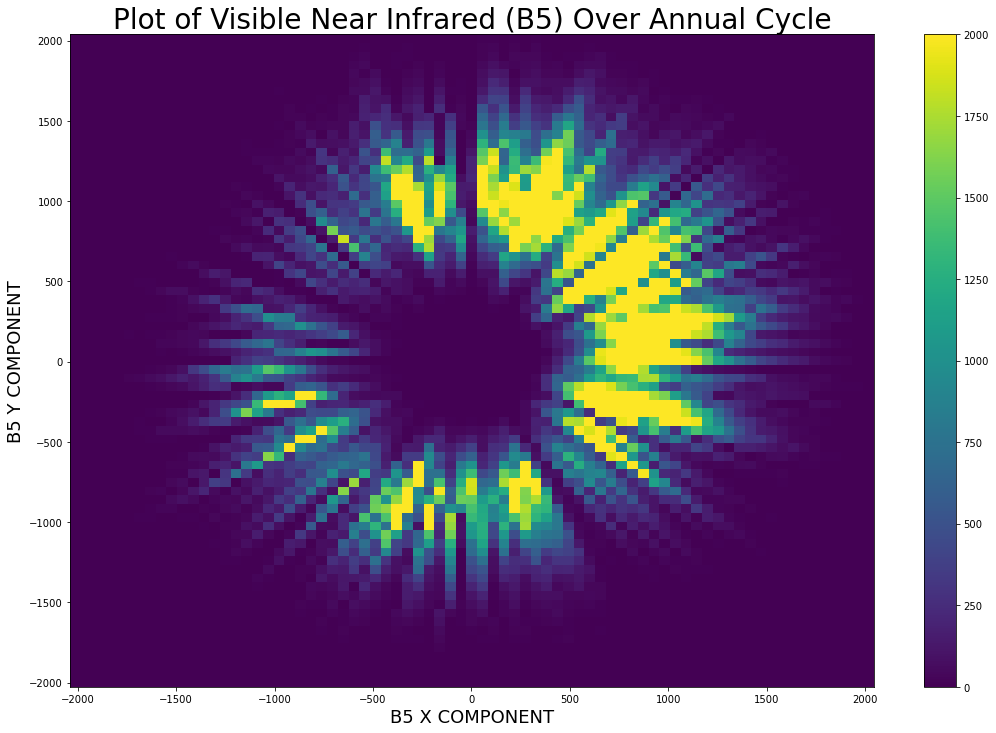

In [15]:
band = 'B5'
plt.figure(figsize=(18, 12))
plt.hist2d(df_vis['{band}_x_comp'.format(band=band)], df_vis['{band}_y_comp'.format(band=band)], bins=(75, 75), cmap = 'viridis', vmax=2000)
plt.colorbar()
plt.title('Plot of Visible Near Infrared ({band}) Over Annual Cycle'.format(band=band), fontsize=28)
plt.xlabel('{band} X COMPONENT'.format(band=band), fontsize=18)
plt.ylabel('{band} Y COMPONENT'.format(band=band), fontsize=18)
ax = plt.gca();

# Adding Jitu's Newest Clusters

In [27]:
years = []
for d in df.Date:
    years.append(d.year)
    
df['Year'] = years
print('MIN YEAR:', df.Year.min(), 'MAX YEAR:', df.Year.max())

In [50]:
dataframes = []
for g in df.groupby(by='Year'):
    tif = rasterio.open('/mnt/locutus/remotesensing/tropics/clustering/costa_rica_panama/v2/costa_rica_panama_interp.2017-2022.h10.{YEAR}.tif'.format(YEAR=g[0]))
    shot_coord_list = np.array([(x,y) for x,y in zip(g[1]['Longitude'] , g[1]['Latitude'])])
    g[1]['Cluster'] = [np.nan if (np.isnan(sample[0])) or sample[0] == 255 else sample[0] for sample in tif.sample(shot_coord_list.astype('float32'))]
    dataframes.append(g[1])
    
df = pd.concat(dataframes)
df = df[~df.Cluster.isna()]
df['Cluster'] = df.Cluster.astype('int8')

### To One Hot Encode the Clusters

In [24]:
# one_hot = pd.get_dummies(df['Cluster'], prefix='Cluster')
# df = df.drop('Cluster',axis = 1)
# df = pd.concat([df, one_hot], axis=1)

# Last look at the df before partitioning for the models

In [62]:
print(df.shape)
print()
print(df.columns)
print()
display(df.head())
print()
display(df[['Sqrt_AGB', 'NDVI', 'Time', 'Radians', 'TX', 'B2', 'B3', 'B4', 'B5', 'B6', 'B7', 'B8', 'B8A', 'B11', 'B12',]].describe())

(1758067, 41)

Index(['Latitude', 'Longitude', 'AGB', 'AGB_SE', 'Time', 'Plant_Type',
       'Leaf_Flag', 'Quality_4A', 'Degrade', 'RH98', 'RH90', 'RH80', 'RH70',
       'RH60', 'RH50', 'RH40', 'RH30', 'RH20', 'TX', 'Lowest_Elev',
       'Sensitivity', 'BeamID', 'Quality_2A', 'Shot_Number', 'Date', 'B2',
       'B3', 'B4', 'B5', 'B6', 'B7', 'B8', 'B8A', 'B11', 'B12', 'Month_Number',
       'Sqrt_AGB', 'NDVI', 'Radians', 'Year', 'Cluster'],
      dtype='object')



,Latitude,Longitude,AGB,AGB_SE,Time,Plant_Type,Leaf_Flag,Quality_4A,Degrade,RH98,...,B8,B8A,B11,B12,Month_Number,Sqrt_AGB,NDVI,Radians,Year,Cluster
87,8.646597,-77.568962,143.922897,13.086390,40947268.0,2.0,1.0,1.0,0.0,25.110001,...,2750.0,3260.0,1659.0,642.0,0,11.996787,0.684533,1.864242,2019,6
86,8.640621,-77.564751,464.079315,13.094982,40947268.0,2.0,0.0,1.0,0.0,40.470001,...,3286.0,3939.0,2292.0,1254.0,0,21.542500,0.505613,1.864242,2019,6
85,8.652192,-77.563118,39.031387,13.098008,40947268.0,2.0,1.0,1.0,0.0,10.140000,...,3744.0,4273.0,2002.0,756.0,0,6.247510,0.681941,1.864242,2019,6
84,8.632226,-77.558685,308.906616,13.087140,40947268.0,2.0,0.0,1.0,0.0,31.330000,...,3877.0,4436.0,2041.0,745.0,0,17.575739,0.735841,1.864242,2019,6
83,8.642732,-77.566269,343.592285,13.100494,40947268.0,2.0,0.0,1.0,0.0,40.470001,...,2754.0,3012.0,1421.0,554.0,0,18.536242,0.602094,1.864242,2019,6


,Sqrt_AGB,NDVI,Time,Radians,TX,B2,B3,B4,B5,B6,B7,B8,B8A,B11,B12
count,1.758067e+06,1.758067e+06,1.758067e+06,1.758067e+06,1.758067e+06,1.758067e+06,1.758067e+06,1.758067e+06,1.758067e+06,1.758067e+06,1.758067e+06,1.758067e+06,1.758067e+06,1.758067e+06,1.758067e+06
mean,9.583678e+00,6.440531e-01,9.037674e+07,2.535099e+00,5.406899e+02,1.015343e+03,9.410487e+02,6.627812e+02,1.035610e+03,2.515942e+03,3.235575e+03,3.093570e+03,3.655095e+03,1.814697e+03,8.039059e+02
std,6.387208e+00,1.216431e-01,2.713399e+07,2.076598e+00,6.467646e+02,1.853375e+02,1.937346e+02,2.457809e+02,2.534589e+02,4.852580e+02,6.631976e+02,6.466893e+02,7.374250e+02,5.072814e+02,3.235918e+02
min,1.694122e-05,-1.285199e-01,4.094727e+07,0.000000e+00,-1.058160e+01,4.820000e+02,3.500000e+02,1.790000e+02,3.020000e+02,9.880000e+02,1.184000e+03,1.088000e+03,1.384000e+03,3.010000e+02,1.080000e+02
25%,4.060665e+00,5.813823e-01,6.661742e+07,7.077214e-01,9.338618e+01,8.850000e+02,8.060000e+02,4.820000e+02,8.560000e+02,2.194000e+03,2.783000e+03,2.657000e+03,3.162000e+03,1.477000e+03,5.750000e+02
50%,9.255083e+00,6.736541e-01,9.169207e+07,1.657104e+00,2.676300e+02,9.970000e+02,9.280000e+02,6.100000e+02,1.013000e+03,2.510000e+03,3.225000e+03,3.090000e+03,3.650000e+03,1.773000e+03,7.280000e+02
75%,1.409738e+01,7.349939e-01,1.151124e+08,4.505251e+00,7.455112e+02,1.128000e+03,1.062000e+03,7.860000e+02,1.192000e+03,2.841000e+03,3.684000e+03,3.531000e+03,4.153000e+03,2.111000e+03,9.670000e+02
max,3.526402e+01,9.119094e-01,1.364467e+08,6.300447e+00,3.779863e+03,1.873000e+03,1.793000e+03,1.719000e+03,2.046000e+03,4.063000e+03,5.307000e+03,5.114000e+03,5.948000e+03,3.532000e+03,1.948000e+03


In [63]:
df_to_save = df[['Latitude', 'Longitude', 'Time', 
                 'RH98', 'RH90', 'RH80', 'RH70',
                 'RH60', 'RH50', 'RH40', 'RH30',
                 'RH20', 'TX', 'B2', 'B3', 'B4',
                 'B5', 'B6', 'B7', 'B8', 'B8A',
                 'B11', 'B12', 'Month_Number',
       'Sqrt_AGB', 'NDVI', 'Radians', 'Cluster']]

# df_to_save = df_to_save[~df_to_save.Cluster.isin([2, 10])] # removing all data from clusters 2 and 10 as they are just too small (or non-existent) to count
df_to_save['Time'] = df_to_save['Time'] - df_to_save['Time'].min()

/tmp/ipykernel_77603/3613996008.py:10: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_to_save['Time'] = df_to_save['Time'] - df_to_save['Time'].min()


In [64]:
count_class_var(df_to_save, 'Cluster')
df_to_save.to_pickle('/mnt/locutus/remotesensing/r62/PRE_TRANSFORMER.pkl')

Cluster 1 : 38
Cluster 2 : 1218
Cluster 3 : 20471
Cluster 4 : 36872
Cluster 5 : 224219
Cluster 6 : 998816
Cluster 7 : 122259
Cluster 8 : 354174


# Plotting NDVI, RH98 and SQRT(AGB) VS Phenoregion

/tmp/ipykernel_77603/3204037830.py:52: UserWarning: FixedFormatter should only be used together with FixedLocator
  ax.set_xticklabels(months)
/tmp/ipykernel_77603/3204037830.py:52: UserWarning: FixedFormatter should only be used together with FixedLocator
  ax.set_xticklabels(months)
/tmp/ipykernel_77603/3204037830.py:52: UserWarning: FixedFormatter should only be used together with FixedLocator
  ax.set_xticklabels(months)
/tmp/ipykernel_77603/3204037830.py:52: UserWarning: FixedFormatter should only be used together with FixedLocator
  ax.set_xticklabels(months)
/tmp/ipykernel_77603/3204037830.py:52: UserWarning: FixedFormatter should only be used together with FixedLocator
  ax.set_xticklabels(months)
/tmp/ipykernel_77603/3204037830.py:52: UserWarning: FixedFormatter should only be used together with FixedLocator
  ax.set_xticklabels(months)


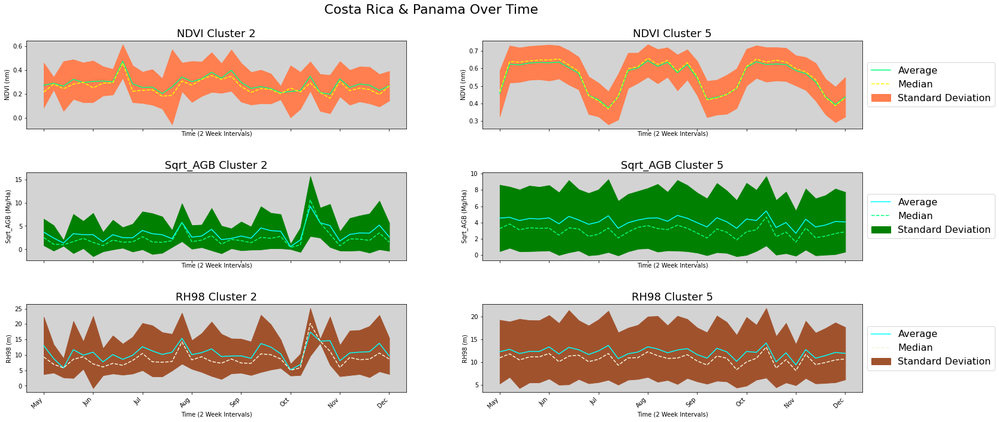

In [98]:
# define subplot grid

fig, axs = plt.subplots(nrows=3, ncols=2, figsize=(25, 12)) # sharey=True,
fig.autofmt_xdate(rotation=45)
plt.subplots_adjust(hspace=0.5)
fig.suptitle("Costa Rica & Panama Over Time", fontsize=22, y=0.95)

# loop through tickers and axes

VARS = ['NDVI', 'NDVI', 'Sqrt_AGB', 'Sqrt_AGB', 'RH98', 'RH98']
clusters = [2,5, 2, 5,2, 5]

for var, cluster, ax in zip(VARS, clusters, axs.ravel()):
    
    cluster = int(cluster)
    sample_df = df[df.Cluster == cluster]
    

    avgs = np.array(sample_df[[var, 'Month_Number']].groupby(['Month_Number']).mean()[var])
    stds = np.array(sample_df[[var, 'Month_Number']].groupby(['Month_Number']).std()[var])
    med = np.array(sample_df[[var, 'Month_Number']].groupby(['Month_Number']).median()[var])
    
    if var == "NDVI":
        
        col = 'coral'
        col1 = 'yellow'
        col2 = 'springgreen'
        units = '(nm)'

    elif var == "Sqrt_AGB":
        
        col = 'green'
        col1 = 'springgreen'
        col2 = 'cyan'
        units = '(Mg/Ha)'
        
    elif var == "RH98":
        
        col = 'sienna'
        col1 = 'beige'
        col2 = 'cyan'
        units = '(m)'
        
    xaxis = np.sort(sample_df.Month_Number.unique())
    ax.set_facecolor("lightgrey")
    ax.set_title('{var} Cluster {cluster}'.format(var = var, cluster=cluster), fontsize=18)
    ax.set_xlabel('Time (2 Week Intervals)')
    ax.set_ylabel('{val} {units}'.format(val=var, units=units))
    ax.fill_between(xaxis, np.array(avgs) - np.array(stds), np.array(avgs) + np.array(stds), color = col, label='Standard Deviation')
    ax.plot(xaxis, avgs, color=col2, label = 'Average')
    ax.plot(xaxis, med, linestyle='dashed', color=col1, label = 'Median')
    ax.set_xticklabels(months)

    if cluster == 5:
        ax.legend(loc='center left', bbox_to_anchor=(1, 0.5), prop={'size': 16}, fontsize = 16)

# plt.savefig('/home/r62/r62_directory/Modeling_AGB_with_S2_bands/Images/Subplots_Main_Vars_Over_Time.png', dpi=330, bbox_inches='tight');

# img = mpimg.imread('/home/r62/r62_directory/Modeling_AGB_with_S2_bands/Images/Subplots_CHT_Over_Time.png')
# plt.imshow(img)
plt.show();

# Creating the t-SNE Diagram

In [16]:
tsne_df = pd.read_pickle('/mnt/locutus/remotesensing/r62/PRE_TRANSFORMER.pkl')
bands_list = ['B2', 'B3', 'B4', 'B5', 'B6', 'B7', 'B8', 'B8A', 'B11', 'B12']
IVS = bands_list + ['Cluster_0', 'Cluster_1', 'Cluster_3', 'Cluster_4',
       'Cluster_5', 'Cluster_6', 'Cluster_7', 'Cluster_8', 'Cluster_9', 'Month_Number', 'Radians', 'NDVI']

one_hot = pd.get_dummies(tsne_df['Cluster'], prefix='Cluster')
tsne_df = tsne_df.drop('Cluster',axis = 1)
tsne_df = pd.concat([tsne_df, one_hot], axis=1)

In [18]:
tsne_df = tsne_df.sample(80000)

IVs = np.array(tsne_df[IVS])
DVs = np.array(tsne_df['Sqrt_AGB'])
perplexity = 20
show_plot=True
n_components=2

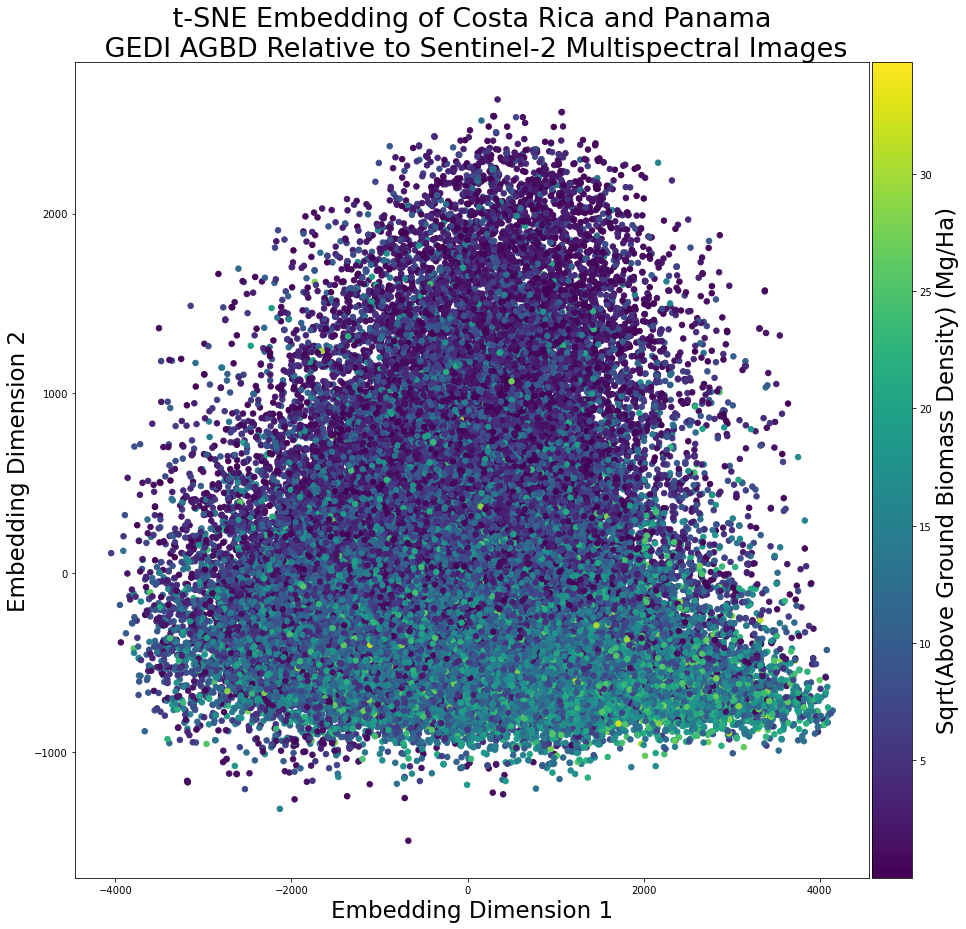

In [21]:
sr_tsne = manifold.TSNE(
  n_components=n_components, 
  perplexity=perplexity, init="pca", random_state=123
).fit_transform(IVs)

if show_plot == True:
    fig, axs = plt.subplots(figsize=(15, 15), nrows=1)

    im = axs.scatter(sr_tsne[:, 0], sr_tsne[:, 1], c=DVs, s=30)
    _ = axs.set_title(" t-SNE Embedding of Costa Rica and Panama \n GEDI AGBD Relative to Sentinel-2 Multispectral Images", fontsize = 27)

    plt.xlabel('Embedding Dimension 1', fontsize = 23)
    plt.ylabel('Embedding Dimension 2', fontsize = 23);
    divider = make_axes_locatable(axs)
    cax = divider.append_axes("right", size="5%", pad=0.05)

    cbar = plt.colorbar(im, cax=cax);
    cbar.ax.set_ylabel('Sqrt(Above Ground Biomass Density) (Mg/Ha)', fontsize = 23)
else:
    print('No Print')
    
plt.savefig('/home/r62/repos/Modeling_AGB_with_S2_bands/Images/tsne_figure.png', facecolor='white', dpi=300);
plt.show();

# Creating stacked subplots of Canopy HT and AGB

In [77]:
months = []
for idx in df.Month_Number.unique():
    sub_df = df[df['Month_Number'] == idx]
    datetime_object = datetime.datetime.strptime(str(sub_df.iloc[0, :].Date.month), "%m")
    month_name = datetime_object.strftime("%b")

    months.append(month_name)

/tmp/ipykernel_77603/2388128830.py:65: UserWarning: FixedFormatter should only be used together with FixedLocator
  ax.set_xticklabels(months, fontsize=16)
/tmp/ipykernel_77603/2388128830.py:65: UserWarning: FixedFormatter should only be used together with FixedLocator
  ax.set_xticklabels(months, fontsize=16)
/tmp/ipykernel_77603/2388128830.py:65: UserWarning: FixedFormatter should only be used together with FixedLocator
  ax.set_xticklabels(months, fontsize=16)
/tmp/ipykernel_77603/2388128830.py:65: UserWarning: FixedFormatter should only be used together with FixedLocator
  ax.set_xticklabels(months, fontsize=16)
/tmp/ipykernel_77603/2388128830.py:65: UserWarning: FixedFormatter should only be used together with FixedLocator
  ax.set_xticklabels(months, fontsize=16)
/tmp/ipykernel_77603/2388128830.py:65: UserWarning: FixedFormatter should only be used together with FixedLocator
  ax.set_xticklabels(months, fontsize=16)
/tmp/ipykernel_77603/2388128830.py:65: UserWarning: FixedFormatt

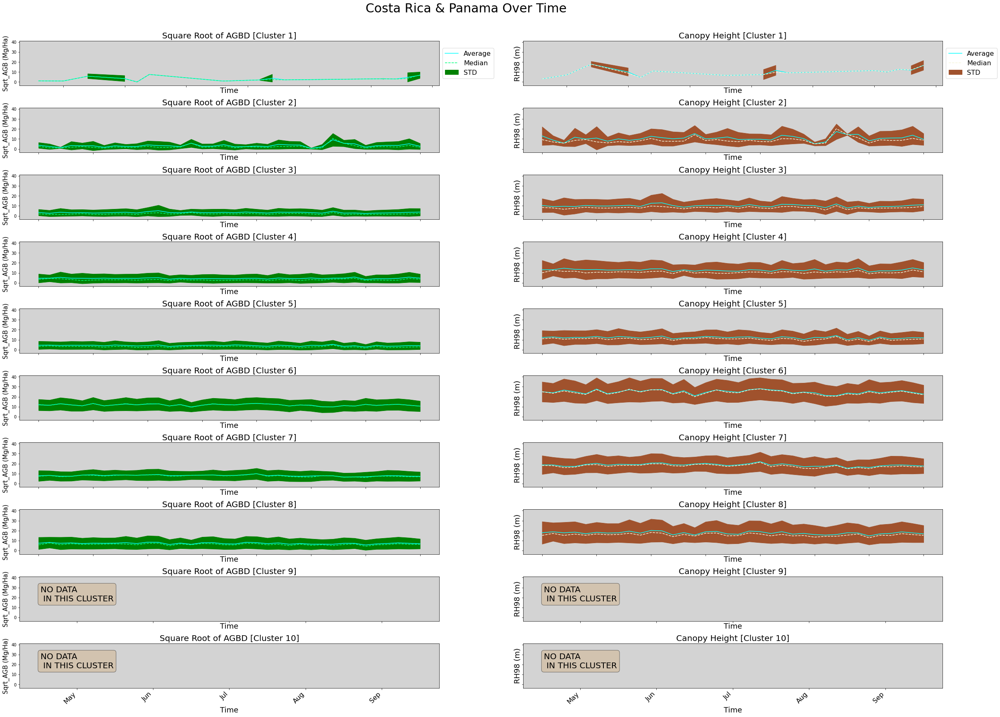

In [94]:
# define subplot grid

fig, axs = plt.subplots(nrows=10, ncols=2, figsize=(40, 32), sharey=True,)
fig.autofmt_xdate(rotation=45)
plt.subplots_adjust(hspace=0.5)
fig.suptitle("Costa Rica & Panama Over Time", fontsize=30, y=0.92)

# loop through tickers and axes

VARS = ['Sqrt_AGB', 'RH98']*10
clusters = [1,1, 2, 2, 3, 3, 4, 4, 5, 5, 6, 6, 7, 7, 8, 8, 9, 9, 10, 10]

for var, cluster, ax in zip(VARS, clusters, axs.ravel()):
    
    cluster = int(cluster)
    sample_df = df[df.Cluster == cluster]
    

    avgs = np.array(sample_df[[var, 'Month_Number']].groupby(['Month_Number']).mean()[var])
    stds = np.array(sample_df[[var, 'Month_Number']].groupby(['Month_Number']).std()[var])
    med = np.array(sample_df[[var, 'Month_Number']].groupby(['Month_Number']).median()[var])
    
    if var == "NDVI":
        
        col = 'coral'
        col1 = 'yellow'
        col2 = 'springgreen'
        units = '(nm)'

    elif var == "Sqrt_AGB":
        
        col = 'green'
        col1 = 'springgreen'
        col2 = 'cyan'
        units = '(Mg/Ha)'
        
    elif var == "RH98":
        
        col = 'sienna'
        col1 = 'beige'
        col2 = 'cyan'
        units = '(m)'
        
    xaxis = np.sort(sample_df.Month_Number.unique())
    ax.set_facecolor("lightgrey")
    
    if var == 'Sqrt_AGB':
        ax.set_title('Square Root of AGBD [Cluster {cluster}]'.format(cluster=cluster), fontsize=20)
        f_size = 15

    elif var == 'RH98':
        ax.set_title('Canopy Height [Cluster {cluster}]'.format(cluster=cluster), fontsize=20)
        f_size = 18
    
    if len(sample_df) == 0:
        ax.set_facecolor("lightgrey")
        ax.text(0.05, 0.6, 'NO DATA \n IN THIS CLUSTER', transform=ax.transAxes, fontsize=20,
        verticalalignment='center', bbox=dict(boxstyle='round', facecolor='tan', alpha=0.5))
    
    ax.set_xlabel('Time', fontsize=18)
    ax.set_ylabel('{val} {units}'.format(val=var, units=units), fontsize=f_size)
    ax.fill_between(xaxis, np.array(avgs) - np.array(stds), np.array(avgs) + np.array(stds), color = col, label='STD')
    ax.plot(xaxis, avgs, color=col2, label = 'Average')
    ax.plot(xaxis, med, linestyle='dashed', color=col1, label = 'Median')
    ax.set_xticklabels(months, fontsize=16)

    if cluster == 1:
        ax.legend(loc='center left', bbox_to_anchor=(1, 0.5), prop={'size': 16}, fontsize = 16)

plt.savefig('/home/r62/r62_directory/Modeling_AGB_with_S2_bands/Images/Subplots_AGB_HT_Over_Time.png', dpi=330, bbox_inches='tight', set_facecolor = 'white');

# img = mpimg.imread('/home/r62/r62_directory/Modeling_AGB_with_S2_bands/Images/Subplots_CHT_Over_Time.png')
# plt.imshow(img)
plt.show();

# Creating the RH Profile Animation

In [128]:
def get_DATE(DATA):
    month_num = DATA.Date.iloc[0].month
    datetime_object = datetime.datetime.strptime(str(month_num), "%m")
    month = datetime_object.strftime("%B")
    year = DATA.Date.iloc[0].year 
    return str(month) + ' ' + str(year)

/tmp/ipykernel_77603/2400973144.py:32: UserWarning: FixedFormatter should only be used together with FixedLocator
  ax.set_xticklabels(xaxis, rotation = 45, fontsize=10)
/tmp/ipykernel_77603/2400973144.py:59: UserWarning: FixedFormatter should only be used together with FixedLocator
  ax.set_xticklabels(xaxis, rotation = 45, fontsize=10)
/tmp/ipykernel_77603/2400973144.py:59: UserWarning: FixedFormatter should only be used together with FixedLocator
  ax.set_xticklabels(xaxis, rotation = 45, fontsize=10)
/tmp/ipykernel_77603/2400973144.py:59: UserWarning: FixedFormatter should only be used together with FixedLocator
  ax.set_xticklabels(xaxis, rotation = 45, fontsize=10)
/tmp/ipykernel_77603/2400973144.py:59: UserWarning: FixedFormatter should only be used together with FixedLocator
  ax.set_xticklabels(xaxis, rotation = 45, fontsize=10)
/tmp/ipykernel_77603/2400973144.py:59: UserWarning: FixedFormatter should only be used together with FixedLocator
  ax.set_xticklabels(xaxis, rotation

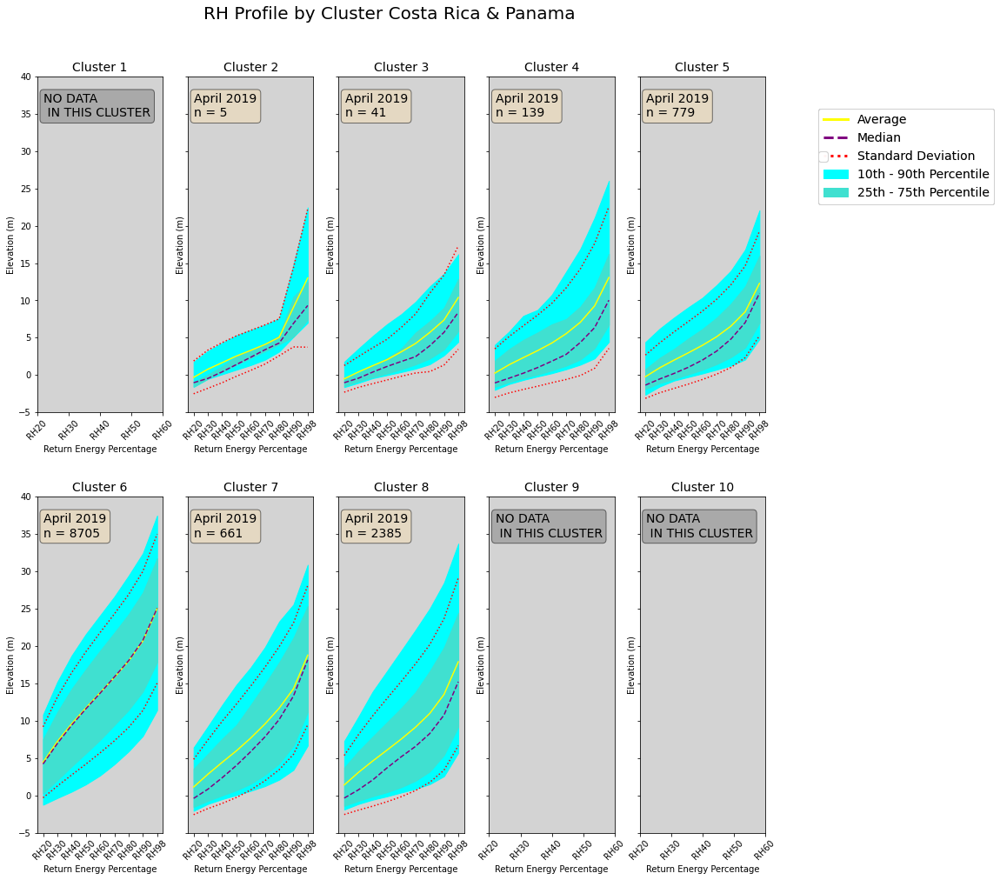

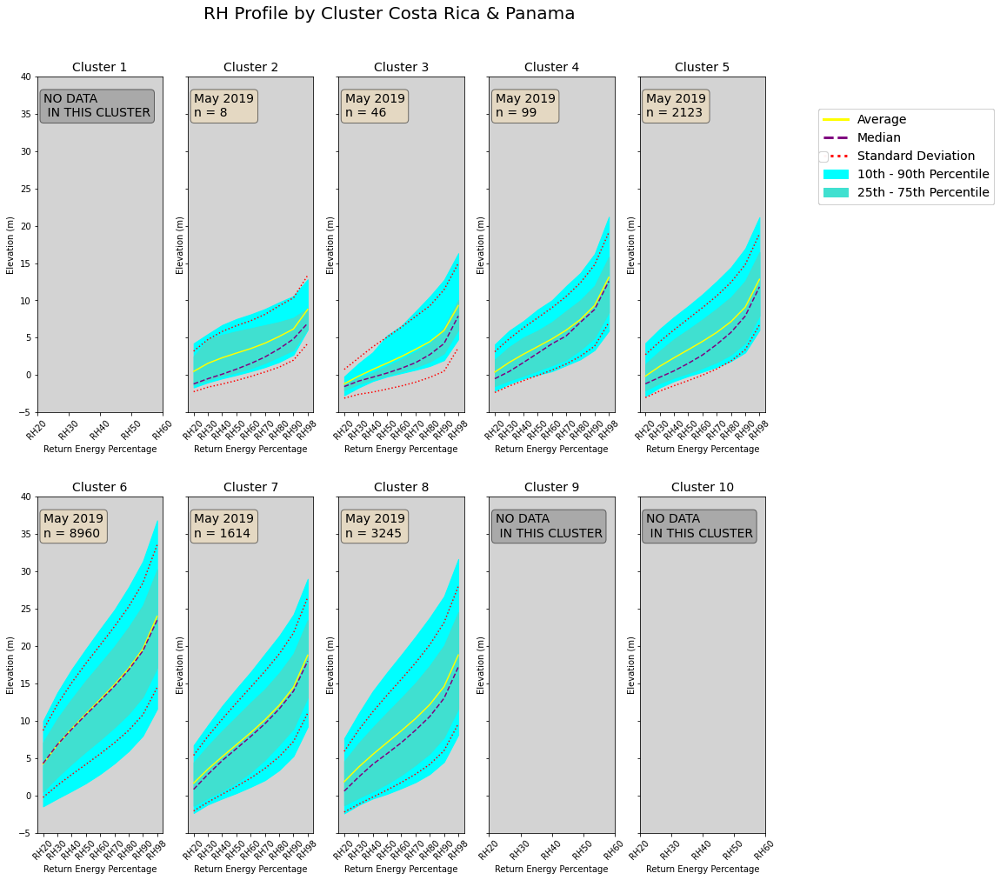

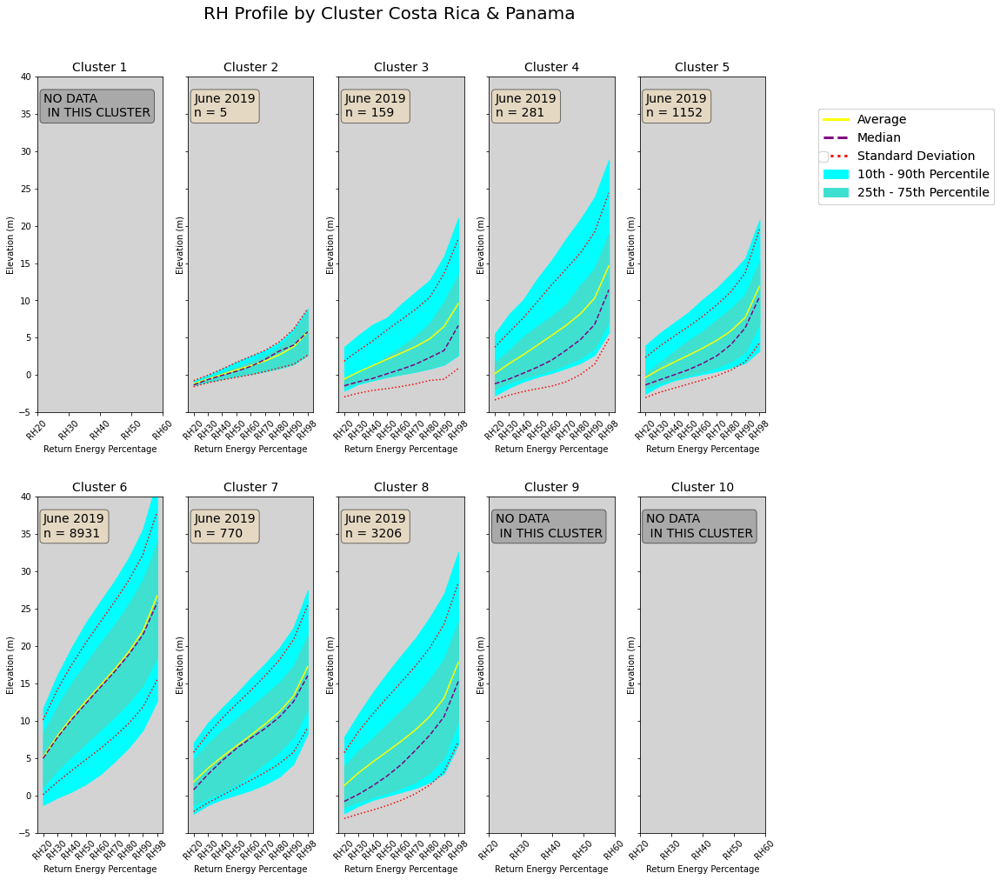

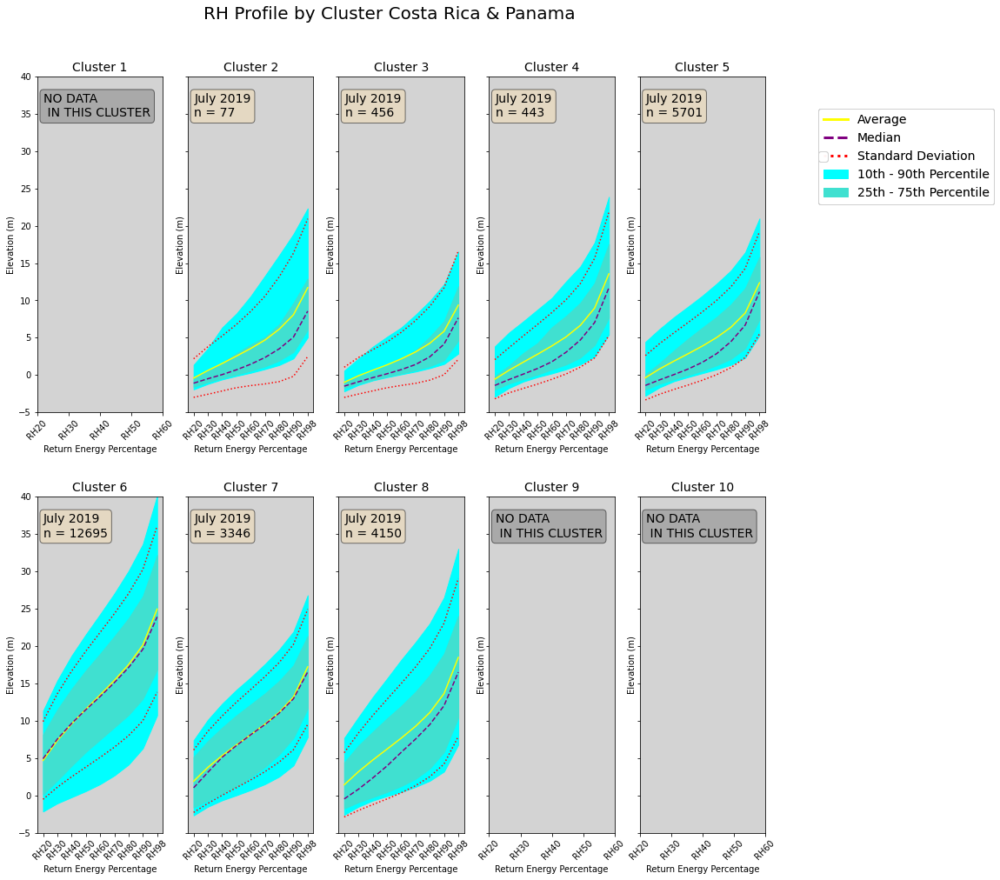

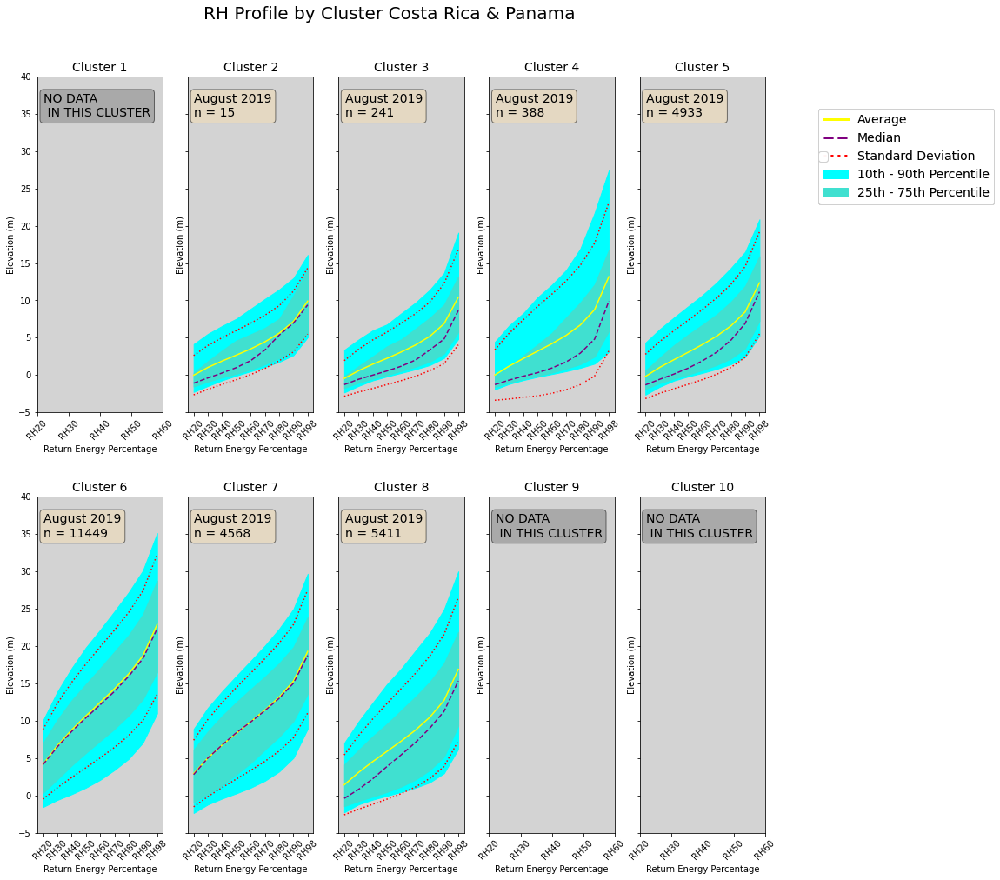

...

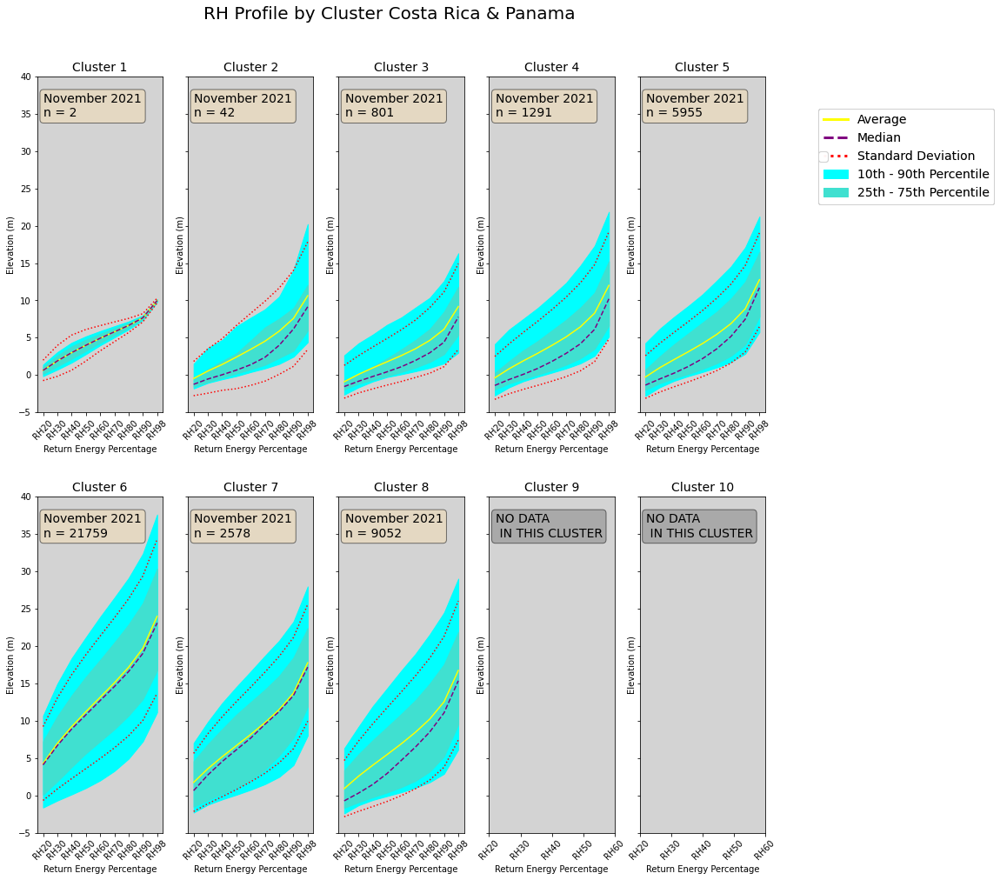

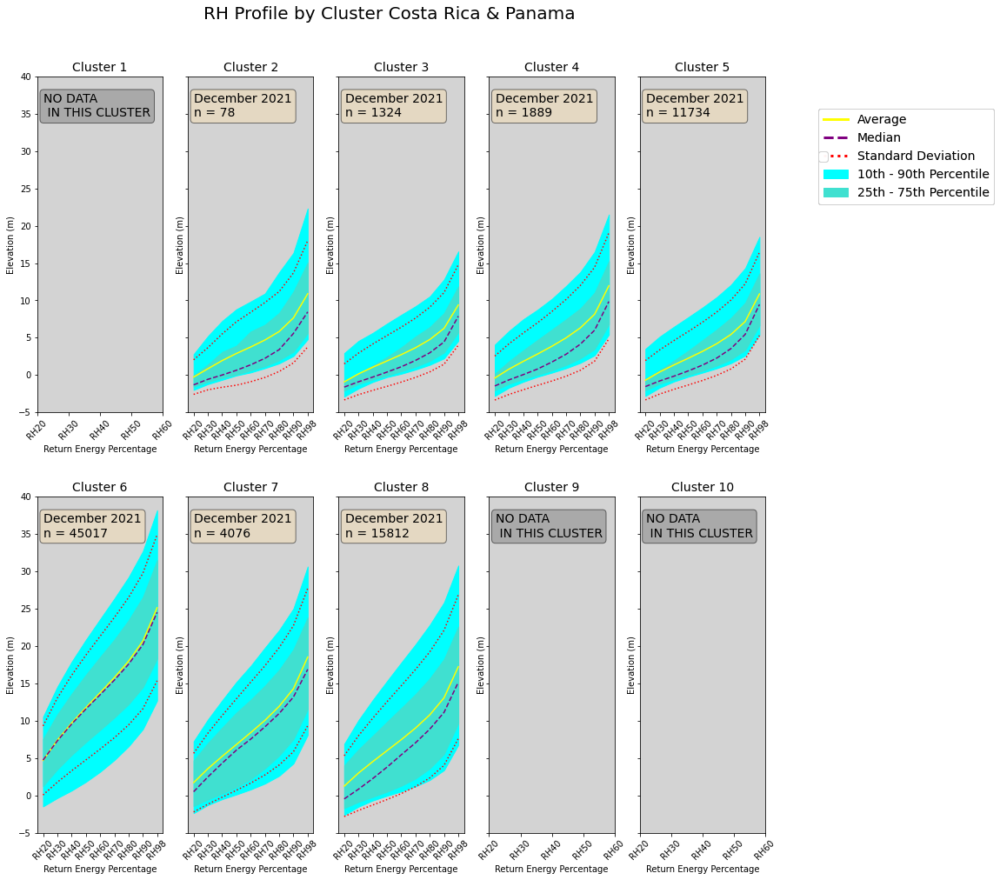

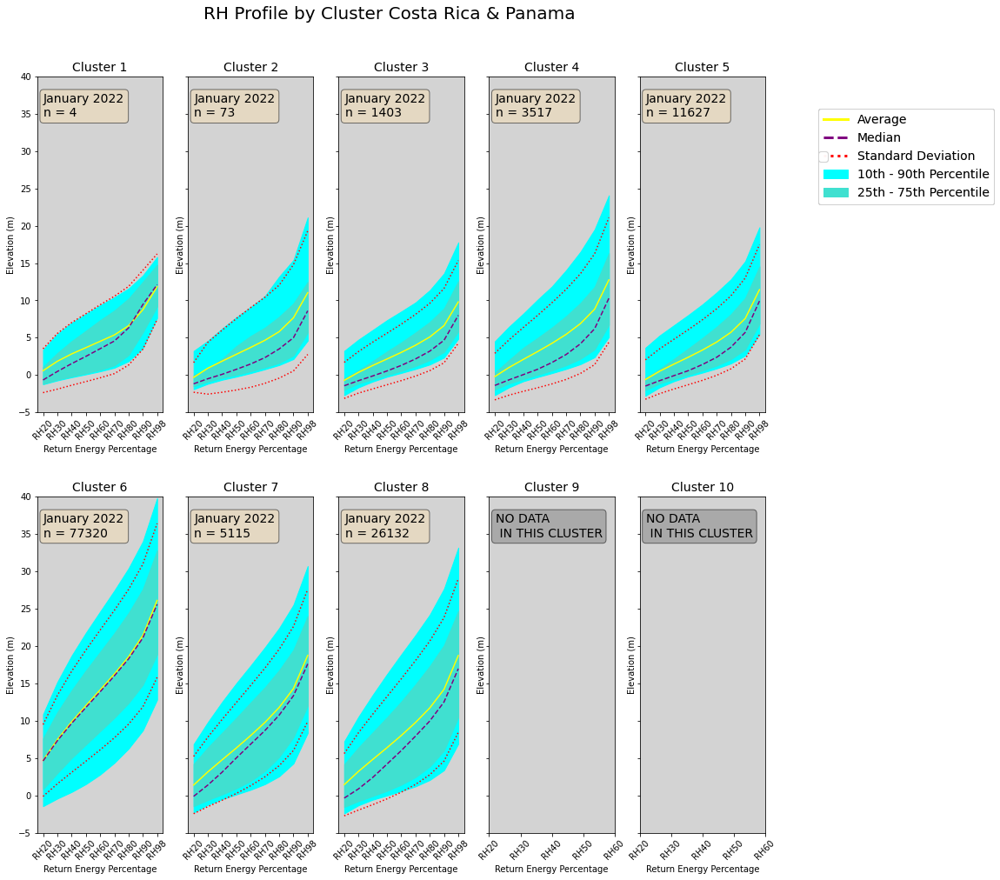

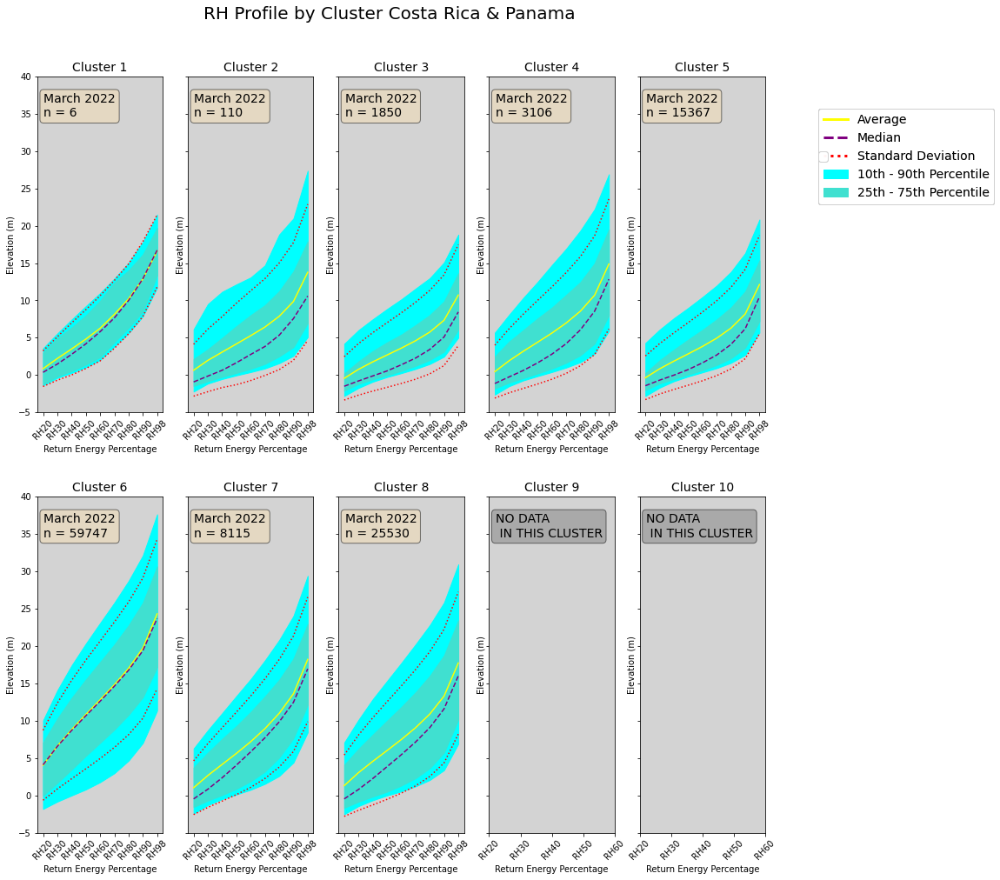

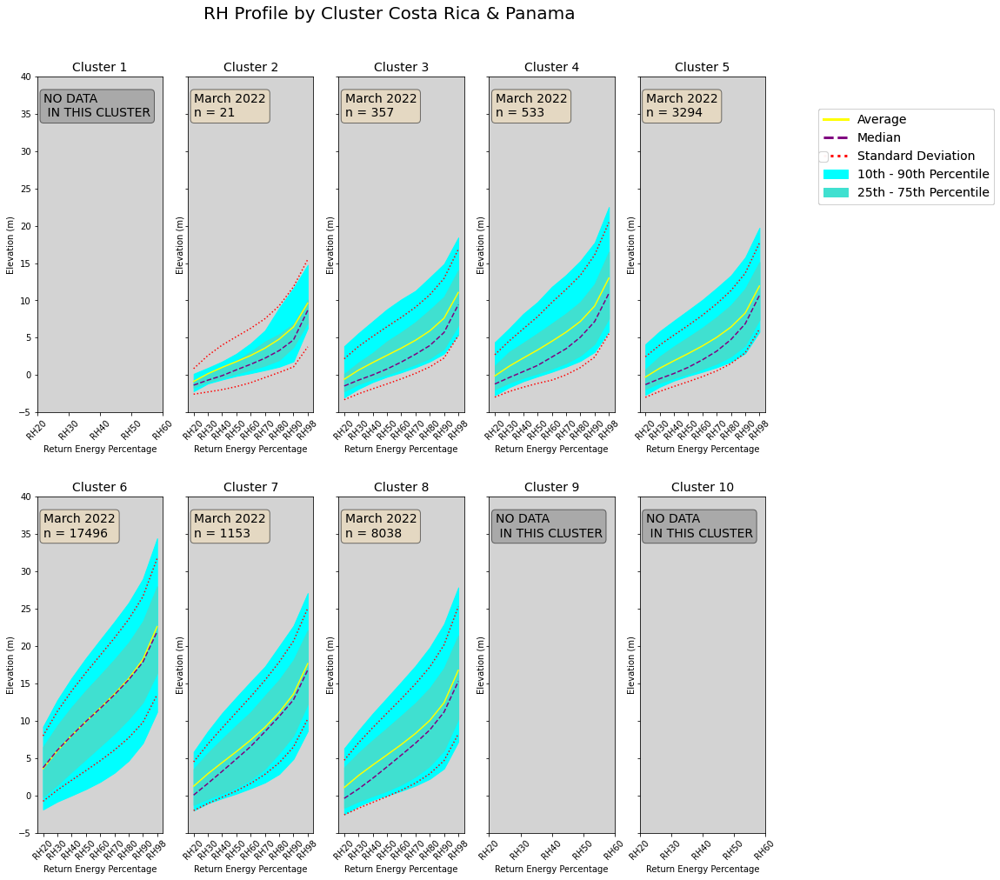

In [131]:
# below creates the static PNG files that will create the GIF
# loop through tickers and axes

time_groups = df.Month_Number.unique()
clusters = [i for i in range(1, 11)]
xaxis = ['RH98', 'RH90', 'RH80', 'RH70', 'RH60', 'RH50', 'RH40', 'RH30', 'RH20']
xaxis.reverse()

for idx, time in enumerate(time_groups):

    fig, axs = plt.subplots(nrows=2, ncols=5, sharey=True, figsize=(15, 16))
    plt.subplots_adjust(hspace=0.25)
    fig.suptitle("RH Profile by Cluster Costa Rica & Panama", fontsize=20, y=0.95)
    
    DATA = df[df.Month_Number == time]
    DATE = get_DATE(DATA)
    for cluster, ax in zip(clusters, axs.ravel()):

        DF = DATA[DATA.Cluster == cluster]
        N = len(DF)
        
        if len(DF) <= 1:
            props = dict(boxstyle='round', facecolor='grey', alpha=0.5)

            # place a text box in upper left in axes coords
            ax.set_facecolor("lightgrey")
            ax.text(0.05, 0.95, 'NO DATA \n IN THIS CLUSTER', transform=ax.transAxes, fontsize=14,
            verticalalignment='top', bbox=props)

            ax.set_title('Cluster {cluster}'.format(cluster=cluster), fontsize=14)
            ax.set_xlabel('Return Energy Percentage')
            ax.set_xticklabels(xaxis, rotation = 45, fontsize=10)
            ax.set_ylabel('Elevation (m)')
            ax.set_ylim((-5, 40))
            
        elif len(DF) > 1:
            
            props = dict(boxstyle='round', facecolor='wheat', alpha=0.5)

            # place a text box in upper left in axes coords
            ax.set_facecolor("lightgrey")
            ax.text(0.05, 0.95, DATE + '\n' + 'n = {N}'.format(N=N), transform=ax.transAxes, fontsize=14,
            verticalalignment='top', bbox=props)
            
            rh_avgs = np.array(DF.mean(numeric_only = True)[xaxis])
            rh_stds = np.array(DF.std(numeric_only = True)[xaxis])
            rh_medians = np.array(DF.median(numeric_only = True)[xaxis])
            rh_q1 = np.array(DF.quantile(0.25)[xaxis])
            rh_q3 = np.array(DF.quantile(0.75)[xaxis])
            rh_p10 = np.array(DF.quantile(0.10)[xaxis])
            rh_p90 = np.array(DF.quantile(0.90)[xaxis])

            ax.fill_between(xaxis, rh_p10, rh_p90, color = 'cyan', label='10th - 90th Percentile')
            ax.fill_between(xaxis, rh_q1, rh_q3, color = 'turquoise', label='25th - 75th Percentile')

            # ax.set_facecolor("lightgrey")
            ax.set_title('Cluster {cluster}'.format(cluster=cluster), fontsize=14)
            ax.set_xlabel('Return Energy Percentage')
            ax.set_xticklabels(xaxis, rotation = 45, fontsize=10)
            ax.set_ylim((-5, 40))

            ax.set_ylabel('Elevation (m)')
            ax.plot(xaxis, np.array(rh_avgs), color='yellow', label = 'Average')
            ax.plot(xaxis, np.array(rh_medians), linestyle='dashed', color='purple', label = 'Median')
            ax.plot(xaxis, np.array(rh_avgs) - np.array(rh_stds), linestyle='dotted', color='red', label = 'Standard Deviation')
            ax.plot(xaxis, np.array(rh_avgs) + np.array(rh_stds), linestyle='dotted', color='red')
            
        handles, labels = ax.get_legend_handles_labels()
        leg = fig.legend(handles, labels, loc='center left', bbox_to_anchor=(0.95, 0.8), prop={'size': 14}, fontsize = 16)
        for line in leg.get_lines():
            line.set_linewidth(3.0)
                
    plt.savefig('/home/r62/r62_directory/Modeling_AGB_with_S2_bands/Images/rh_profiles_for_GIF/Subplots_RH_Profile_by_cluster_time_{TIME}.png'.format(TIME=idx), 
    dpi=200, bbox_inches='tight', facecolor='white', edgecolor='black');
    # plt.show();

### IMPLEMENTING JITU'S CLUSTERS

#### Assuming a two week time interval

AVG BAND 1 OF 1 IS 1.389416147816911
STD BAND 1 OF 1 IS 2.6897366187168146
NUMBER OF CLASSES: 10


/home/r62/anaconda3/lib/python3.9/site-packages/pandas/core/generic.py:5507: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self[name] = value


Each interval is a time span of: 14 days, 16:12:28.051948
There are 78 Time interval groups.


/tmp/ipykernel_13835/519502386.py:39: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  DF['Group'] = group


NUMBER OF DAYS BETWEEN THE TWO DATES: 1139 NUMBER OF BIWEEKS BETWEEN THE TWO DATES: 78
2019-04-19 22:14:16
2022-05-24 07:00:32


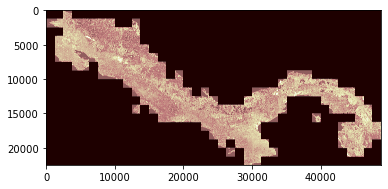

In [25]:
plot = False

bands_data = pd.DataFrame()
tif_example = rasterio.open('/mnt/locutus/remotesensing/tropics/clustering/costa_rica_panama/k_10/costa_rica_panama_biweekly_smooth.2017-2020.10.mode.tif')

data = tif_example.read(1)

if plot == True:
    plt.imshow(data, cmap='pink')
    
print('NUMBER OF CLASSES:', data.max())


shot_coord_list = np.array([(x,y) for x,y in zip(df['Longitude'] , df['Latitude'])])

bands_data['Cluster'] = [np.nan if (np.isnan(sample[0]) or sample[0] == 0) else sample[0] for sample in tif_example.sample(shot_coord_list.astype('float32'))]
bands_data['Shot_Number'] = np.array(list((map(str, df['Shot_Number']))))

data = df[['Latitude', 'Longitude', 'AGB', 'Time', 'Date', 'RH98', 'RH90', 'RH80', 'RH70', 'RH60', 'RH50', 'RH40', 'RH30', 'RH20', 'Shot_Number', 'NDVI']]
data.Shot_Number = data.Shot_Number.astype('int64')
bands_data.Shot_Number = bands_data.Shot_Number.astype('int64')
data = pd.merge(data, bands_data, on='Shot_Number', how='inner')

S2_range = []
for x in range(days_between.days + 1):
    S2_range.append(datetime.timedelta(days=x)+datetime.datetime(2019, 4, 27)) # year month day

interval = (S2_range[-1] - S2_range[0])/(78-1)
print('Each interval is a time span of:', interval)
grouped_cr = data.groupby(pd.Grouper(key='Date', freq=interval))
print('There are', len(grouped_cr.groups), 'Time interval groups.')
number_groups = len(grouped_cr.groups)

lis = []
for group, i in enumerate(grouped_cr, start = 1):
    DF = i[1]
    DF['Group'] = group
    lis.append(DF)

data = pd.concat(lis)

# 2019-04-20 is the first day of GEDI data which is the 110th day of 2019
# 110/365 = 0.3 
# 0.3*25 = 7.5 so we start on the 7 1/2th biweek of 2019 so we should start on the 8th biweek

# assuming 25 time periods in 2019 2019/25 = 14.6 days/biweek
# 14.6*8 = 117th day which = April 27 2019

# june 6th 2022 was the 157th day of the year
# 157/365 = 0.4301
# 0.4301*25 = 10.75 so we start on the 10 3/4 biweek of 2022 so we should end on the 11th biweek
# 14.6*11 = 160th day which = June 9 2022

# how many biweeks between them? 
days_between = datetime.datetime(2022, 6, 9) - datetime.datetime(2019, 4, 27)
biweeks = days_between/14.6

print('NUMBER OF DAYS BETWEEN THE TWO DATES:', days_between.days, 'NUMBER OF BIWEEKS BETWEEN THE TWO DATES:', biweeks.days)

print(data.Date.min())
print(data.Date.max())

GROUPS = datetime.datetime(2019, 4, 13) + data.Group*datetime.timedelta(days = 14)
data['Group'] = GROUPS

### Creating DNN Dataset

In [18]:
df['group_x'] = pd.cut(df.Longitude, bins=10)
df['group_y'] = pd.cut(df.Latitude, bins=10)

In [64]:
print(df.columns)
df.shape

Index(['Latitude', 'Longitude', 'Time', 'RH98', 'RH90', 'RH80', 'RH70', 'RH60',
       'RH50', 'RH40', 'RH30', 'RH20', 'TX', 'B2', 'B3', 'B4', 'B5', 'B6',
       'B7', 'B8', 'B8A', 'B11', 'B12', 'Month_Number', 'Sqrt_AGB', 'NDVI',
       'Radians', 'Cluster'],
      dtype='object')


(1883769, 28)

In [60]:
TRAIN = np.zeros(60)
VAL = np.ones(20)
TEST = np.ones(20)+1
mask = np.concatenate([TRAIN, VAL, TEST])
random.shuffle(mask)

train, val, test = [], [], []
for grp, idx in zip(df.groupby(['group_x', 'group_y']), mask):
    GRP = grp[1]
    if idx == 0:
        train.append(GRP)
    if idx == 1:
        val.append(GRP)
    if idx == 2:
        test.append(GRP)
        
train = pd.concat(train)
val = pd.concat(val)
test = pd.concat(test)
print(train.shape[0], val.shape[0], test.shape[0])

969086 433642 469551


In [51]:
train.columns

Index(['Latitude', 'Longitude', 'AGB', 'AGB_SE', 'Time', 'Plant_Type',
       'Leaf_Flag', 'Quality_4A', 'Degrade', 'RH98', 'RH90', 'RH80', 'RH70',
       'RH60', 'RH50', 'RH40', 'RH30', 'RH20', 'TX', 'Lowest_Elev',
       'Sensitivity', 'BeamID', 'Quality_2A', 'Shot_Number', 'Date', 'B2',
       'B3', 'B4', 'B5', 'B6', 'B7', 'B8', 'B8A', 'B11', 'B12', 'Group_Number',
       'Sqrt_AGB', 'Radians', 'C_1.0', 'C_2.0', 'C_3.0', 'C_4.0', 'C_5.0',
       'C_6.0', 'C_7.0', 'C_8.0', 'C_9.0', 'C_10.0', 'group_x', 'group_y'],
      dtype='object')

In [61]:
train = train[['Sqrt_AGB', 'Latitude', 'Longitude', 'TX', 'Time', 'B2', 'B3', 'B4', 'B5', 'B6', 'B7', 'B8', 'B8A', 'B11', 'B12', 'Radians',
   'C_1.0', 'C_2.0', 'C_3.0', 'C_4.0', 'C_5.0',
    'C_6.0', 'C_7.0', 'C_8.0', 'C_9.0', 'C_10.0']]
val = val[['Sqrt_AGB', 'Latitude', 'Longitude', 'TX', 'Time', 'B2', 'B3', 'B4', 'B5', 'B6', 'B7', 'B8', 'B8A', 'B11', 'B12', 'Radians',
   'C_1.0', 'C_2.0', 'C_3.0', 'C_4.0', 'C_5.0',
    'C_6.0', 'C_7.0', 'C_8.0', 'C_9.0', 'C_10.0']]
test = test[['Sqrt_AGB', 'Latitude', 'Longitude', 'TX', 'Time', 'B2', 'B3', 'B4', 'B5', 'B6', 'B7', 'B8', 'B8A', 'B11', 'B12', 'Radians',
   'C_1.0', 'C_2.0', 'C_3.0', 'C_4.0', 'C_5.0',
    'C_6.0', 'C_7.0', 'C_8.0', 'C_9.0', 'C_10.0']]

train['Latitude'] = (train['Latitude']-train['Latitude'].min())/df.Latitude.max()
train['Longitude'] = (train['Longitude']-train['Latitude'].min())/df.Longitude.max()
train['TX'] = (train['TX'] - train['TX'].min())/df.TX.max()

val['Latitude'] = (val['Latitude']-val['Latitude'].min())/df.Latitude.max()
val['Longitude'] = (val['Longitude']-val['Longitude'].min())/df.Longitude.max()

test['Latitude'] = (test['Latitude']-test['Latitude'].min())/df.Latitude.max()
test['Longitude'] = (test['Longitude']-test['Longitude'].min())/df.Longitude.max()

In [27]:
# train, val, test = split_train_val_test(df_DNN, 0.6, 0.2, how='random')
# train.shape

/home/r62/anaconda3/lib/python3.9/site-packages/pandas/core/frame.py:4901: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  return super().drop(


(1123367, 23)

In [62]:
train_y = train.pop('Sqrt_AGB')
val_y = val.pop('Sqrt_AGB')
test_y = test.pop('Sqrt_AGB')

In [63]:
print(train.shape)
print(train.min(), train.max())

(969086, 25)
Latitude     0.000000
Longitude    1.004202
TX           0.000000
Time         0.000000
B2           0.000000
B3           0.000000
B4           0.000000
B5           0.002969
B6           0.002996
B7           0.000000
B8           0.000000
B8A          0.000000
B11          0.009585
B12          0.009369
Radians      0.000000
C_1.0        0.000000
C_2.0        0.000000
C_3.0        0.000000
C_4.0        0.000000
C_5.0        0.000000
C_6.0        0.000000
C_7.0        0.000000
C_8.0        0.000000
C_9.0        0.000000
C_10.0       0.000000
dtype: float64 Latitude     0.347823
Longitude    1.113206
TX           0.918438
Time         1.000000
B2           1.000000
B3           1.000000
B4           1.000000
B5           1.000000
B6           1.000000
B7           1.000000
B8           1.000000
B8A          0.999801
B11          1.000000
B12          1.000000
Radians      1.000000
C_1.0        1.000000
C_2.0        1.000000
C_3.0        1.000000
C_4.0        1.000000
C_5.

In [1]:
train = train[['Sqrt_AGB', 'TX', 'Time', 'B2', 'B3', 'B4', 'B5', 'B6', 'B7', 'B8', 'B8A', 'B11', 'B12', 'Radians',
   'C_1.0', 'C_2.0', 'C_3.0', 'C_4.0', 'C_5.0',
    'C_6.0', 'C_7.0', 'C_8.0', 'C_9.0', 'C_10.0']]
val = val[['Sqrt_AGB', 'TX', 'Time', 'B2', 'B3', 'B4', 'B5', 'B6', 'B7', 'B8', 'B8A', 'B11', 'B12', 'Radians',
   'C_1.0', 'C_2.0', 'C_3.0', 'C_4.0', 'C_5.0',
    'C_6.0', 'C_7.0', 'C_8.0', 'C_9.0', 'C_10.0']]
test = test[['Sqrt_AGB', 'TX', 'Time', 'B2', 'B3', 'B4', 'B5', 'B6', 'B7', 'B8', 'B8A', 'B11', 'B12', 'Radians',
   'C_1.0', 'C_2.0', 'C_3.0', 'C_4.0', 'C_5.0',
    'C_6.0', 'C_7.0', 'C_8.0', 'C_9.0', 'C_10.0']]

NameError: name 'train' is not defined

In [64]:
# train, val, test = split_train_val_test(df_DNN, 0.6, 0.2, how='random')

dnn_data_dict = {'train_X': train, 'train_y': train_y, 'val_X': val, 'val_y': val_y, 'test_X': test, 'test_y': test_y}

In [67]:
dnn_data_dict = {'train_X': train, 'train_y': train_y, 'val_X': val, 'val_y': val_y, 'test_X': test, 'test_y': test_y}
write_pickle('/mnt/locutus/remotesensing/r62/FINAL_DNN_DATA.pkl', dnn_data_dict)

### Below Creates the RH Profiles

/tmp/ipykernel_56955/4261770381.py:59: UserWarning: FixedFormatter should only be used together with FixedLocator
  ax.set_xticklabels(xaxis, rotation = 45, fontsize=10)
/tmp/ipykernel_56955/4261770381.py:59: UserWarning: FixedFormatter should only be used together with FixedLocator
  ax.set_xticklabels(xaxis, rotation = 45, fontsize=10)


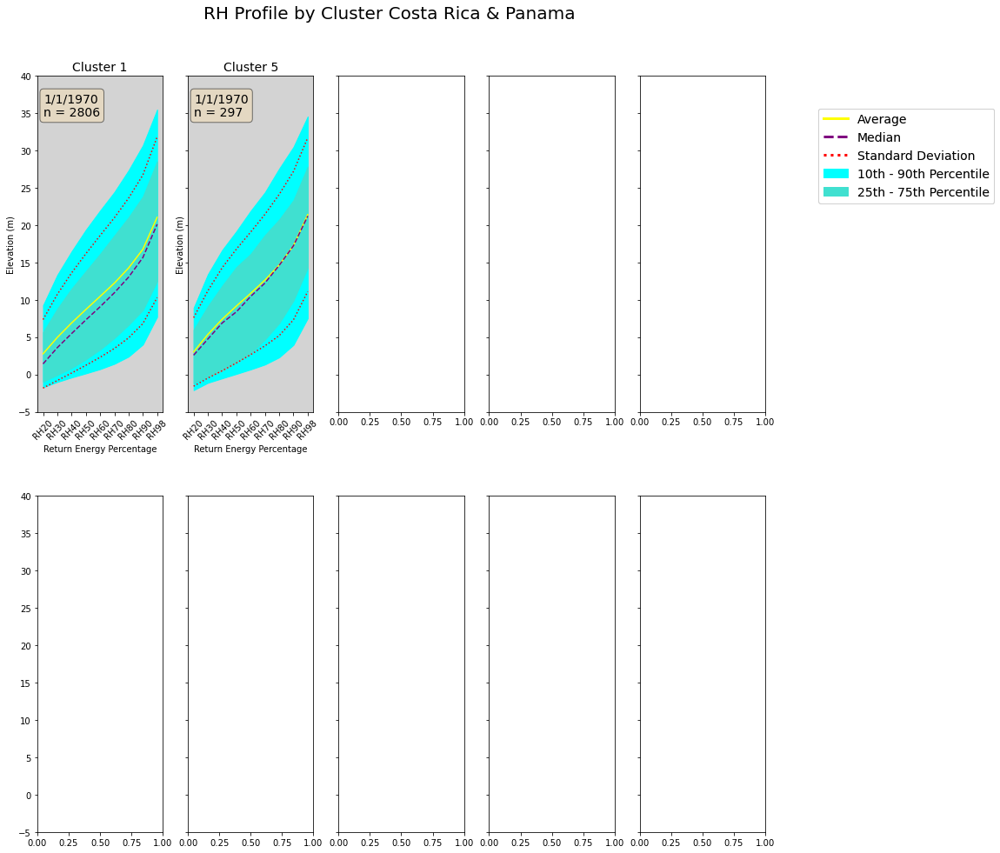

/tmp/ipykernel_56955/4261770381.py:59: UserWarning: FixedFormatter should only be used together with FixedLocator
  ax.set_xticklabels(xaxis, rotation = 45, fontsize=10)
/tmp/ipykernel_56955/4261770381.py:59: UserWarning: FixedFormatter should only be used together with FixedLocator
  ax.set_xticklabels(xaxis, rotation = 45, fontsize=10)


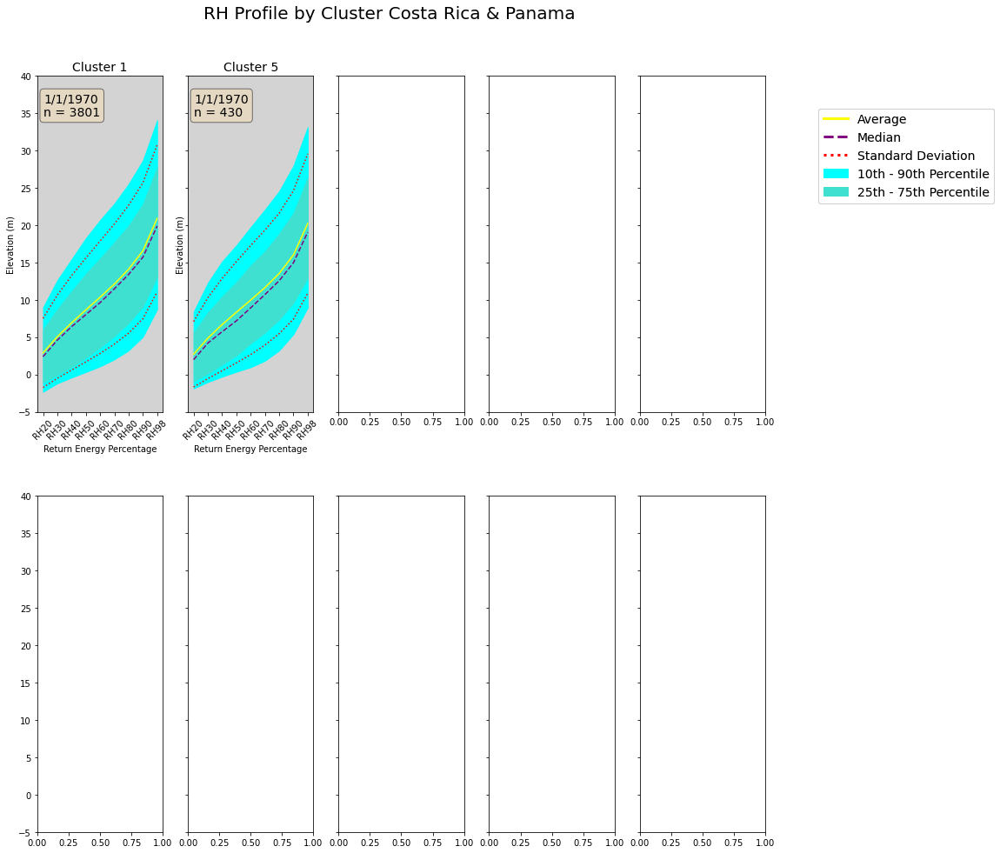

/tmp/ipykernel_56955/4261770381.py:59: UserWarning: FixedFormatter should only be used together with FixedLocator
  ax.set_xticklabels(xaxis, rotation = 45, fontsize=10)
/tmp/ipykernel_56955/4261770381.py:59: UserWarning: FixedFormatter should only be used together with FixedLocator
  ax.set_xticklabels(xaxis, rotation = 45, fontsize=10)


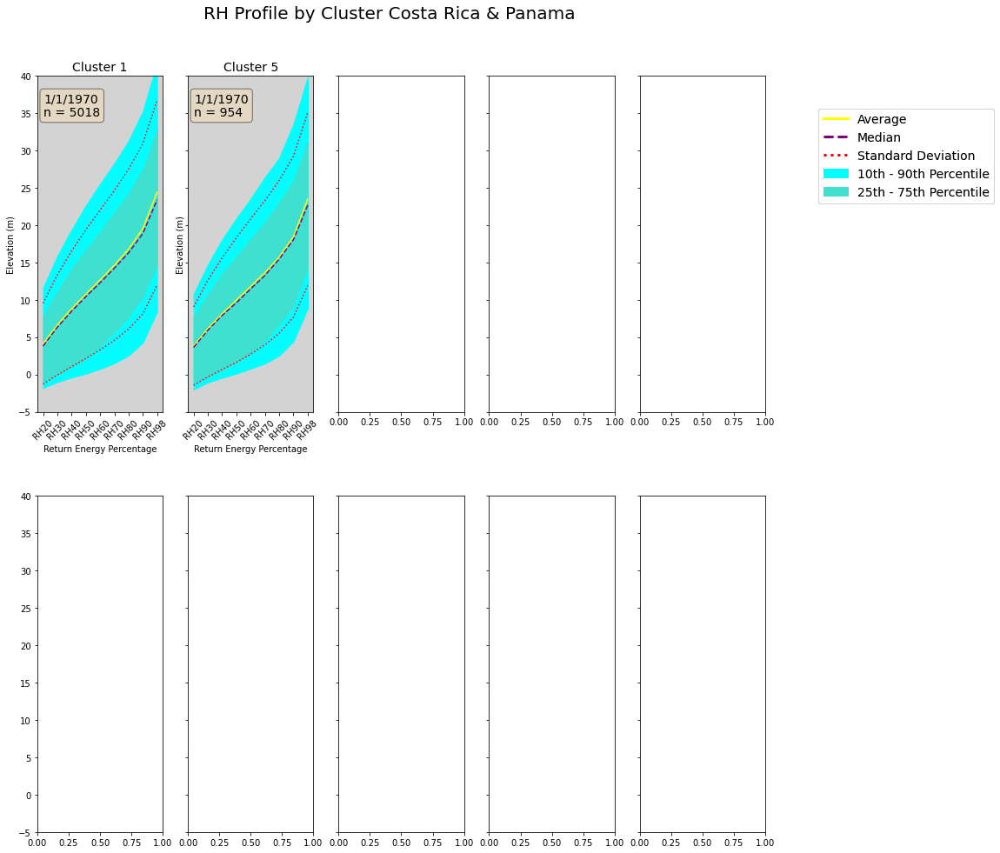

/tmp/ipykernel_56955/4261770381.py:59: UserWarning: FixedFormatter should only be used together with FixedLocator
  ax.set_xticklabels(xaxis, rotation = 45, fontsize=10)
/tmp/ipykernel_56955/4261770381.py:59: UserWarning: FixedFormatter should only be used together with FixedLocator
  ax.set_xticklabels(xaxis, rotation = 45, fontsize=10)


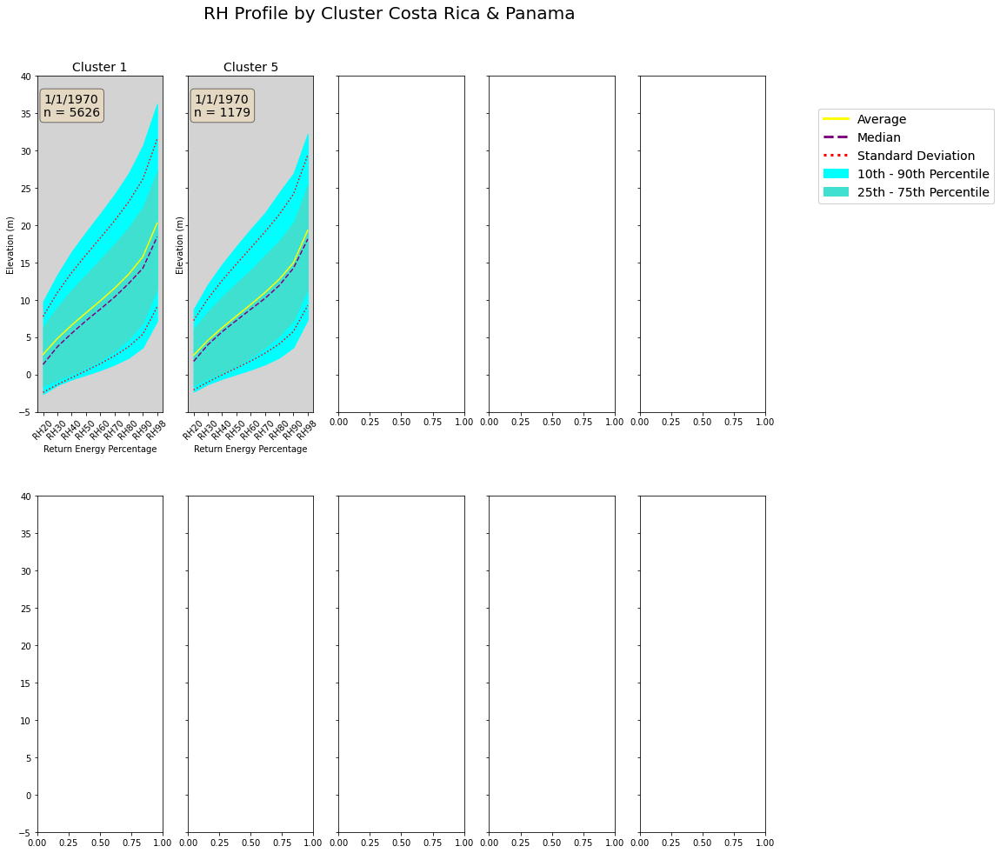

/tmp/ipykernel_56955/4261770381.py:59: UserWarning: FixedFormatter should only be used together with FixedLocator
  ax.set_xticklabels(xaxis, rotation = 45, fontsize=10)
/tmp/ipykernel_56955/4261770381.py:59: UserWarning: FixedFormatter should only be used together with FixedLocator
  ax.set_xticklabels(xaxis, rotation = 45, fontsize=10)


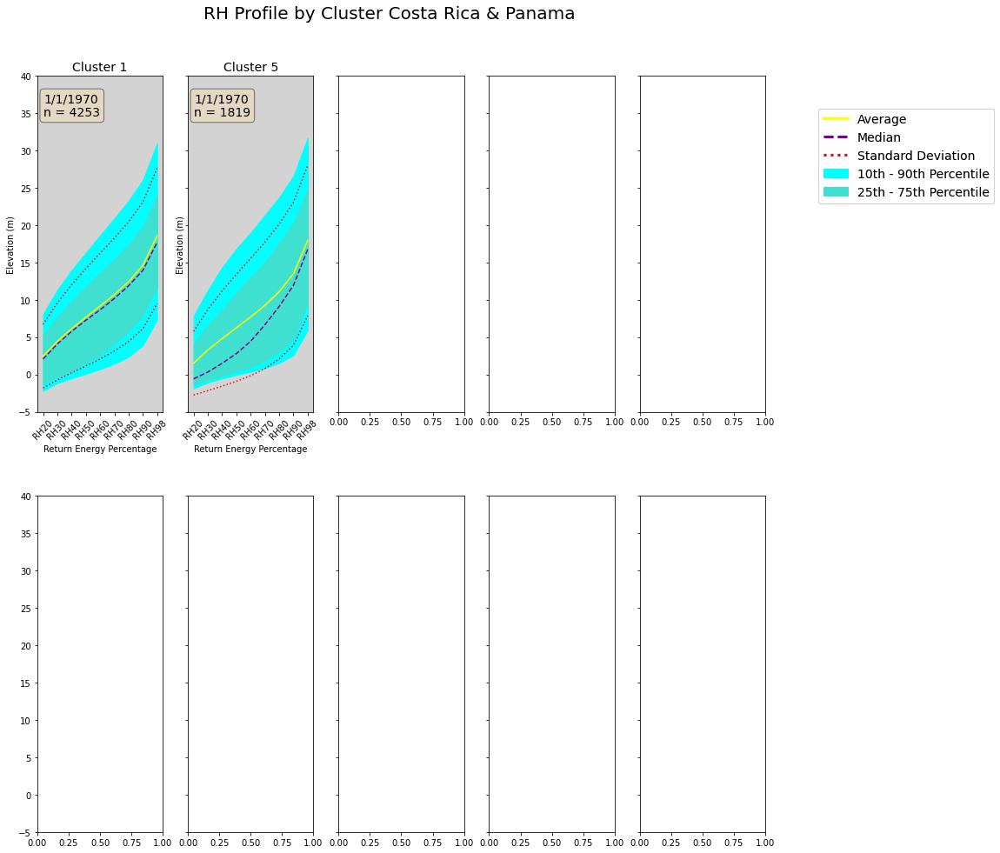

/tmp/ipykernel_56955/4261770381.py:59: UserWarning: FixedFormatter should only be used together with FixedLocator
  ax.set_xticklabels(xaxis, rotation = 45, fontsize=10)
/tmp/ipykernel_56955/4261770381.py:59: UserWarning: FixedFormatter should only be used together with FixedLocator
  ax.set_xticklabels(xaxis, rotation = 45, fontsize=10)


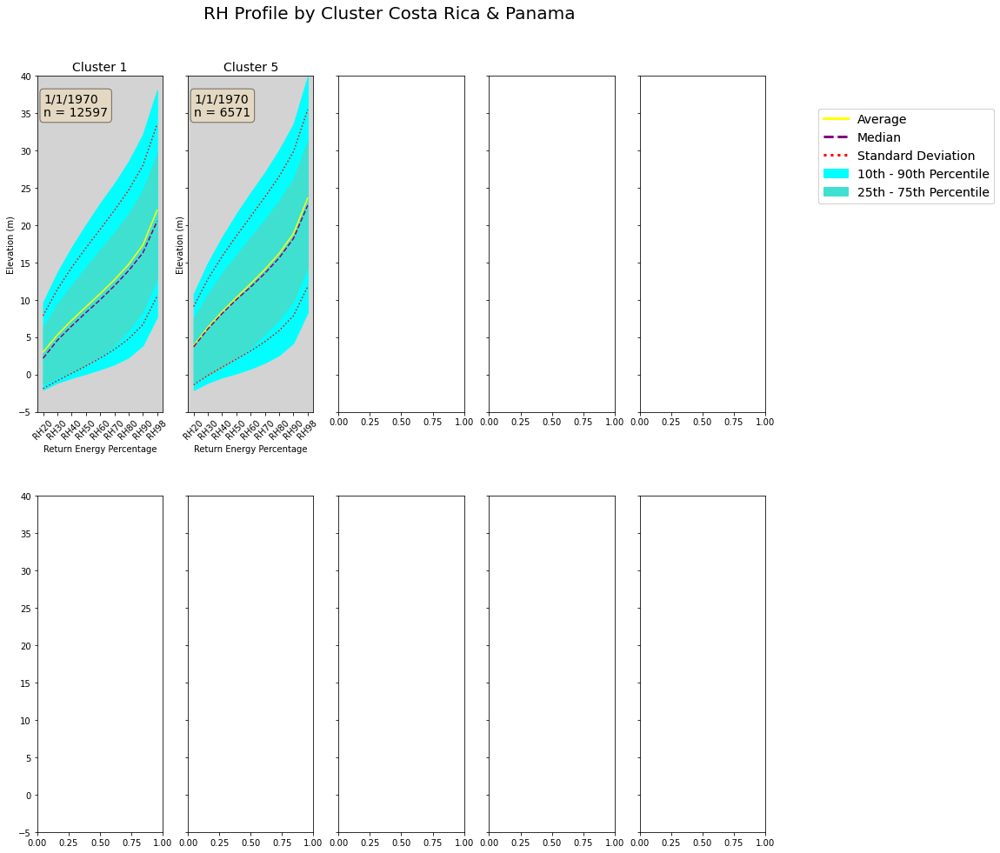

/tmp/ipykernel_56955/4261770381.py:59: UserWarning: FixedFormatter should only be used together with FixedLocator
  ax.set_xticklabels(xaxis, rotation = 45, fontsize=10)
/tmp/ipykernel_56955/4261770381.py:59: UserWarning: FixedFormatter should only be used together with FixedLocator
  ax.set_xticklabels(xaxis, rotation = 45, fontsize=10)


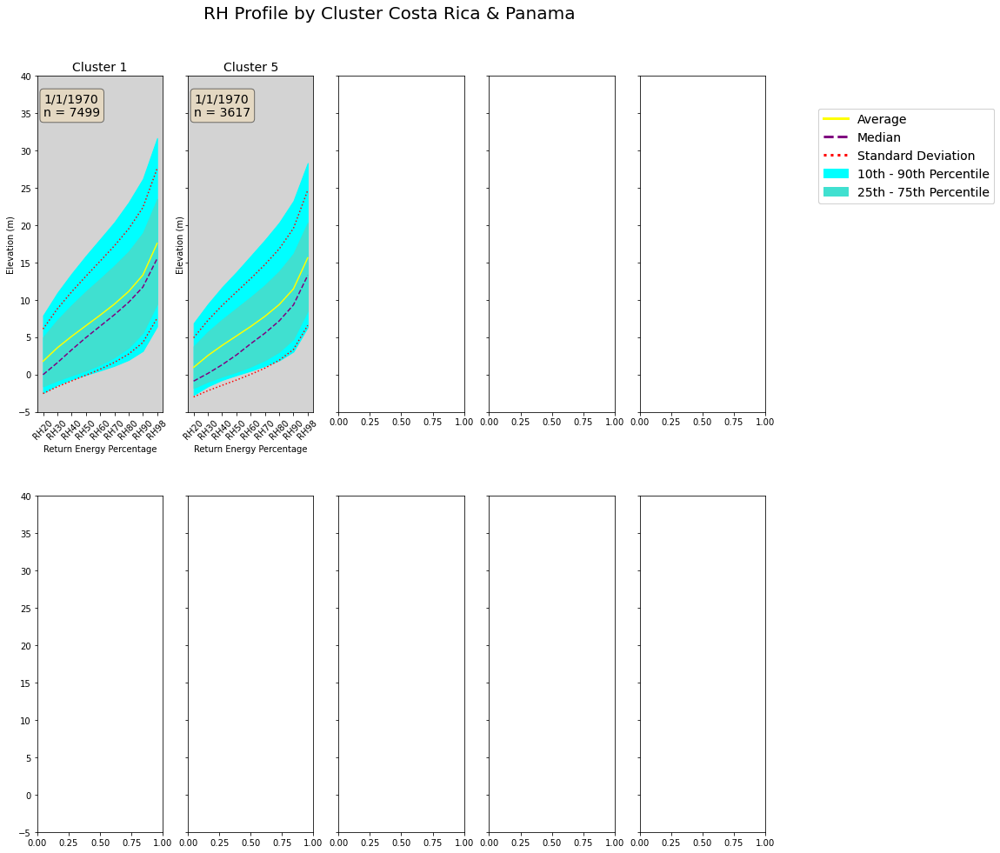

/tmp/ipykernel_56955/4261770381.py:59: UserWarning: FixedFormatter should only be used together with FixedLocator
  ax.set_xticklabels(xaxis, rotation = 45, fontsize=10)
/tmp/ipykernel_56955/4261770381.py:59: UserWarning: FixedFormatter should only be used together with FixedLocator
  ax.set_xticklabels(xaxis, rotation = 45, fontsize=10)


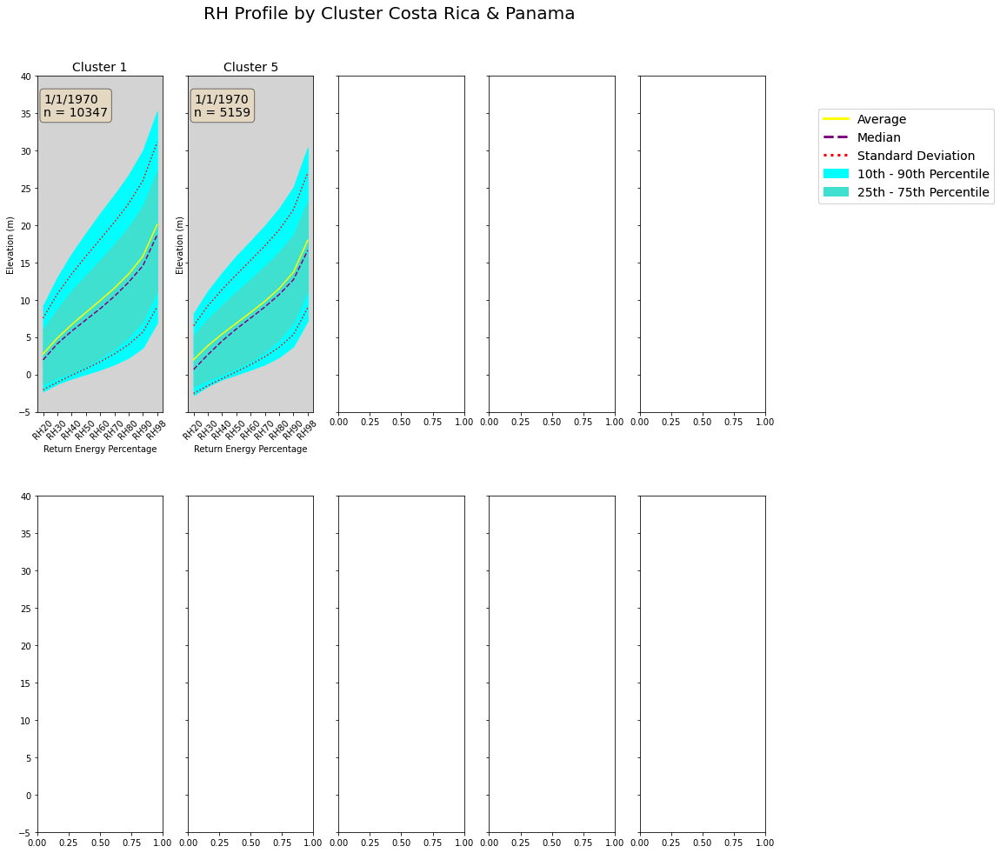

/tmp/ipykernel_56955/4261770381.py:59: UserWarning: FixedFormatter should only be used together with FixedLocator
  ax.set_xticklabels(xaxis, rotation = 45, fontsize=10)
/tmp/ipykernel_56955/4261770381.py:59: UserWarning: FixedFormatter should only be used together with FixedLocator
  ax.set_xticklabels(xaxis, rotation = 45, fontsize=10)


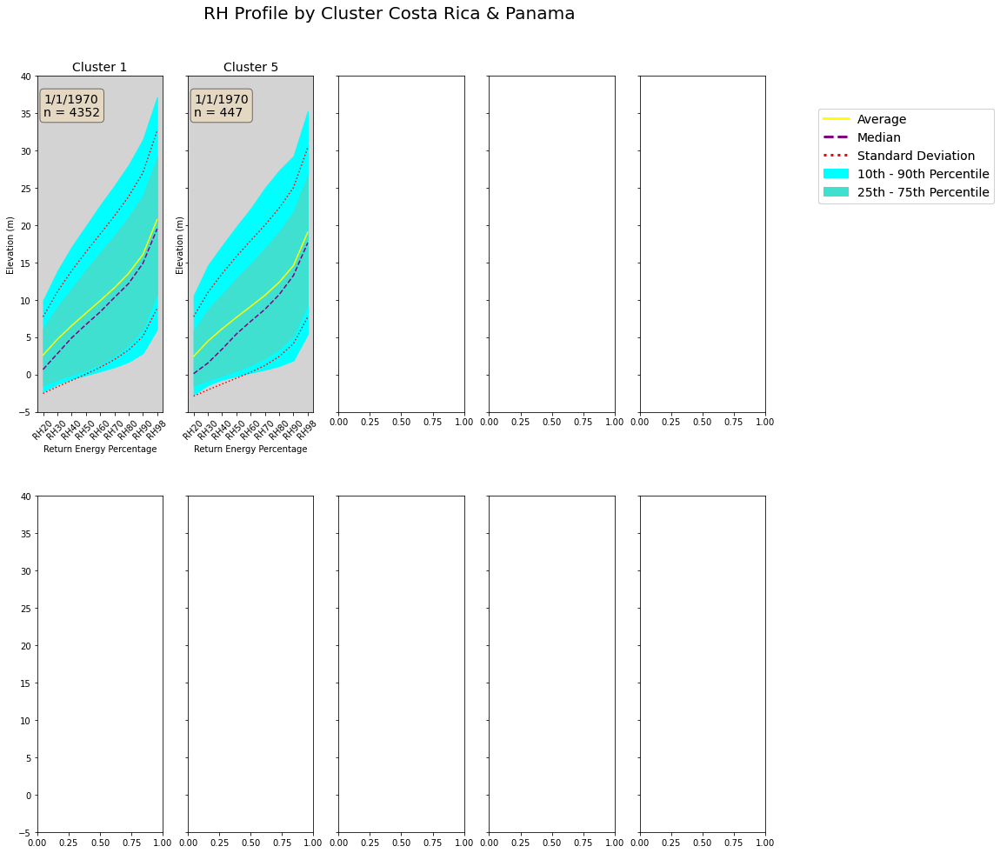

/tmp/ipykernel_56955/4261770381.py:59: UserWarning: FixedFormatter should only be used together with FixedLocator
  ax.set_xticklabels(xaxis, rotation = 45, fontsize=10)
/tmp/ipykernel_56955/4261770381.py:59: UserWarning: FixedFormatter should only be used together with FixedLocator
  ax.set_xticklabels(xaxis, rotation = 45, fontsize=10)


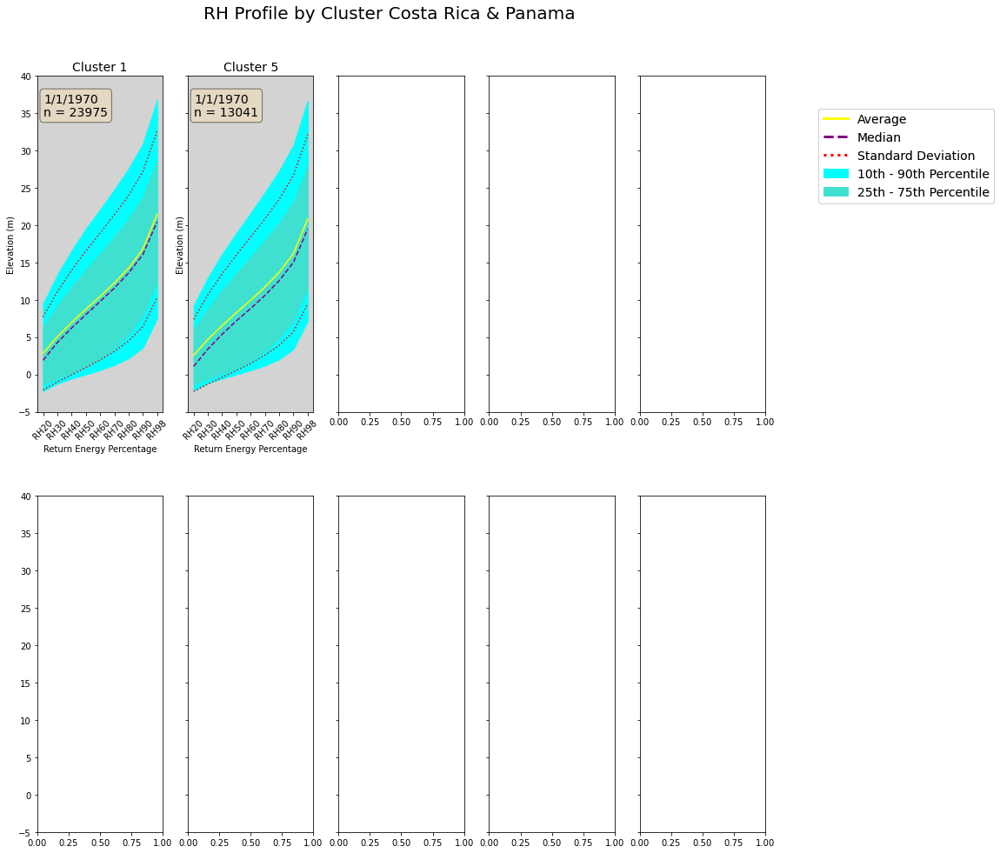

/tmp/ipykernel_56955/4261770381.py:59: UserWarning: FixedFormatter should only be used together with FixedLocator
  ax.set_xticklabels(xaxis, rotation = 45, fontsize=10)
/tmp/ipykernel_56955/4261770381.py:59: UserWarning: FixedFormatter should only be used together with FixedLocator
  ax.set_xticklabels(xaxis, rotation = 45, fontsize=10)


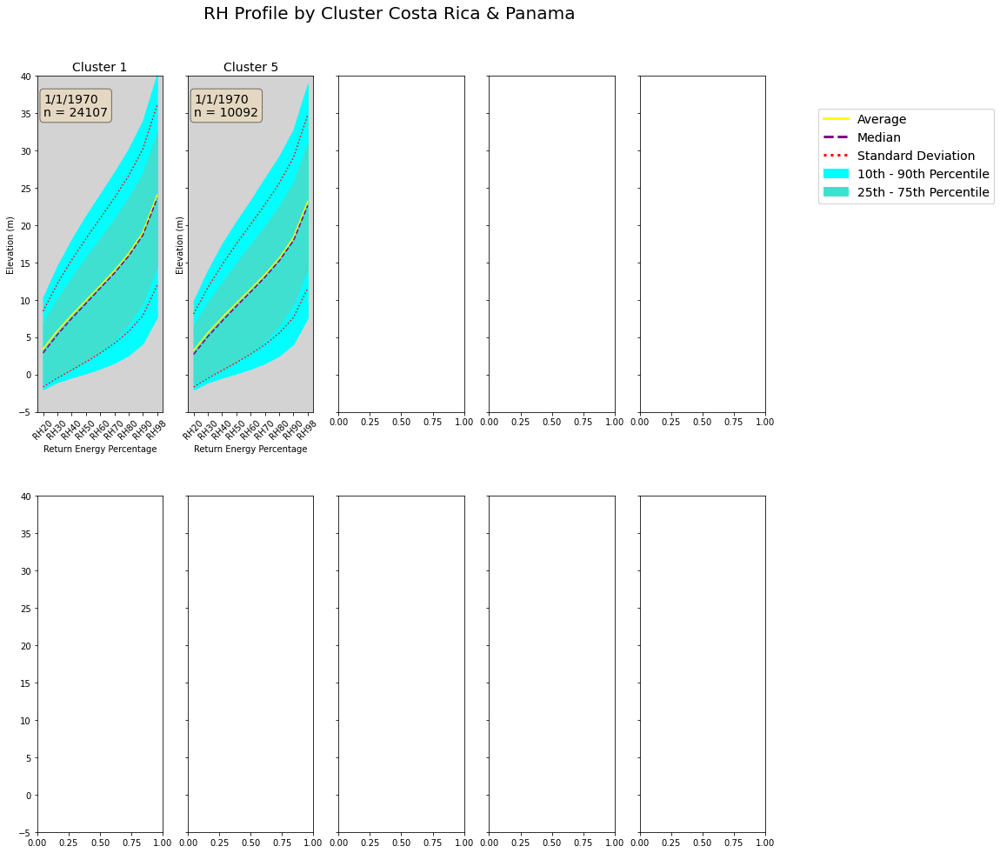

/tmp/ipykernel_56955/4261770381.py:59: UserWarning: FixedFormatter should only be used together with FixedLocator
  ax.set_xticklabels(xaxis, rotation = 45, fontsize=10)
/tmp/ipykernel_56955/4261770381.py:59: UserWarning: FixedFormatter should only be used together with FixedLocator
  ax.set_xticklabels(xaxis, rotation = 45, fontsize=10)


KeyboardInterrupt: 

In [65]:
# below creates the static PNG files that will create the GIF
# loop through tickers and axes

time_groups = df.Month_Number.unique()
clusters = [i for i in range(1, 11)]
xaxis = ['RH98', 'RH90', 'RH80', 'RH70', 'RH60', 'RH50', 'RH40', 'RH30', 'RH20']
xaxis.reverse()

for idx, time in enumerate(time_groups):
    DATE = str(pd.Timestamp(time).month) + '/' + str(pd.Timestamp(time).day) + '/' + str(pd.Timestamp(time).year)
    fig, axs = plt.subplots(nrows=2, ncols=5, sharey=True, figsize=(15, 16))
    plt.subplots_adjust(hspace=0.25)
    fig.suptitle("RH Profile by Cluster Costa Rica & Panama", fontsize=20, y=0.95)
    
    DATA = df[df.Month_Number == time]
    
    for cluster, ax in zip(clusters, axs.ravel()):

        DF = DATA[DATA.Cluster == cluster]
        N = len(DF)
        
        if len(DF) <= 1:
            props = dict(boxstyle='round', facecolor='grey', alpha=0.5)

            # place a text box in upper left in axes coords
            ax.set_facecolor("lightgrey")
            ax.text(0.05, 0.95, 'NO DATA \n IN THIS CLUSTER', transform=ax.transAxes, fontsize=14,
            verticalalignment='top', bbox=props)

            ax.set_title('Cluster {cluster}'.format(cluster=cluster), fontsize=14)
            ax.set_xlabel('Return Energy Percentage')
            ax.set_xticklabels(xaxis, rotation = 45, fontsize=10)
            ax.set_ylabel('Elevation (m)')
            ax.set_ylim((-5, 40))
            
        elif len(DF) > 1:
            
            props = dict(boxstyle='round', facecolor='wheat', alpha=0.5)

            # place a text box in upper left in axes coords
            ax.set_facecolor("lightgrey")
            ax.text(0.05, 0.95, DATE + '\n' + 'n = {N}'.format(N=N), transform=ax.transAxes, fontsize=14,
            verticalalignment='top', bbox=props)
            
            rh_avgs = np.array(DF.mean(numeric_only = True)[xaxis])
            rh_stds = np.array(DF.std(numeric_only = True)[xaxis])
            rh_medians = np.array(DF.median(numeric_only = True)[xaxis])
            rh_q1 = np.array(DF.quantile(0.25)[xaxis])
            rh_q3 = np.array(DF.quantile(0.75)[xaxis])
            rh_p10 = np.array(DF.quantile(0.10)[xaxis])
            rh_p90 = np.array(DF.quantile(0.90)[xaxis])

            ax.fill_between(xaxis, rh_p10, rh_p90, color = 'cyan', label='10th - 90th Percentile')
            ax.fill_between(xaxis, rh_q1, rh_q3, color = 'turquoise', label='25th - 75th Percentile')

            # ax.set_facecolor("lightgrey")
            ax.set_title('Cluster {cluster}'.format(cluster=cluster), fontsize=14)
            ax.set_xlabel('Return Energy Percentage')
            ax.set_xticklabels(xaxis, rotation = 45, fontsize=10)
            ax.set_ylim((-5, 40))

            ax.set_ylabel('Elevation (m)')
            ax.plot(xaxis, np.array(rh_avgs), color='yellow', label = 'Average')
            ax.plot(xaxis, np.array(rh_medians), linestyle='dashed', color='purple', label = 'Median')
            ax.plot(xaxis, np.array(rh_avgs) - np.array(rh_stds), linestyle='dotted', color='red', label = 'Standard Deviation')
            ax.plot(xaxis, np.array(rh_avgs) + np.array(rh_stds), linestyle='dotted', color='red')
            
        handles, labels = ax.get_legend_handles_labels()
        leg = fig.legend(handles, labels, loc='center left', bbox_to_anchor=(0.95, 0.8), prop={'size': 14}, fontsize = 16)
        for line in leg.get_lines():
            line.set_linewidth(3.0)
                
    # plt.savefig('/home/r62/r62_directory/Modeling_AGB_with_S2_bands/Images/rh_profiles_for_GIF/Subplots_RH_Profile_by_cluster_time_{TIME}.png'.format(TIME=idx), 
    # dpi=200, bbox_inches='tight', facecolor='white', edgecolor='black');
    plt.show();

In [93]:
df = pd.read_pickle('/mnt/locutus/remotesensing/r62/PRE_TRANSFORMER.pkl')

In [95]:
df['Month_Number'] = df.Month_Number + 4

In [96]:
df['Month_Number'].unique()

array([ 4,  5,  6,  7,  8,  9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20,
       21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37,
       38, 39])

In [101]:
df['plot_date'].unique() #= df.Month_Number%12

array([ 4,  5,  6,  7,  8,  9, 10, 11,  0,  1,  2,  3])

In [103]:
plot_date = []
for month in df['plot_date']:
    
    if month == 0:
        plot_date.append('Dec')
    else:
        datetime_object = datetime.datetime.strptime(str(month), "%m")
        month_name = datetime_object.strftime("%b")
        plot_date.append(month_name)
    

In [104]:
33%12

9

### Below Creates Plots for Either RH98 or AGBD or NDVI

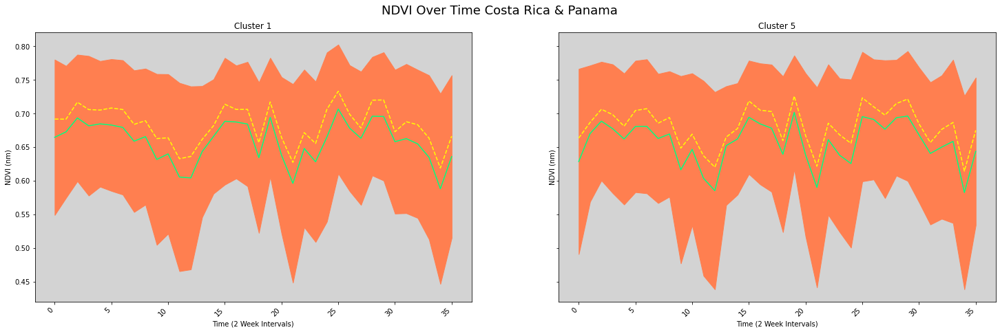

In [72]:
# define subplot grid
fig, axs = plt.subplots(nrows=1, ncols=2, sharey=True, figsize=(25, 8))
fig.autofmt_xdate(rotation=45)
plt.subplots_adjust(hspace=0.0005)
y_value_plotted = 'NDVI'
fig.suptitle("{val} Over Time Costa Rica & Panama".format(val=y_value_plotted), fontsize=18, y=0.95)

# loop through tickers and axes
clusters = [1, 5]
for cluster, ax in zip(clusters, axs.ravel()):
    
    DF = df[df.Cluster == cluster]
    
    ht_avgs = np.array(DF[[y_value_plotted, 'Month_Number']].groupby(['Month_Number']).mean()[y_value_plotted])
    ht_stds = np.array(DF[[y_value_plotted, 'Month_Number']].groupby(['Month_Number']).std()[y_value_plotted])
    ht_med = np.array(DF[[y_value_plotted, 'Month_Number']].groupby(['Month_Number']).median()[y_value_plotted])

    xaxis = np.sort(DF.Month_Number.unique())
    ax.set_facecolor("lightgrey")
    ax.set_title('Cluster {cluster}'.format(cluster=cluster))
    ax.set_xlabel('Time (2 Week Intervals)')
    ax.set_ylabel('{val} (nm)'.format(val=y_value_plotted))
    ax.fill_between(xaxis, np.array(ht_avgs) - np.array(ht_stds), np.array(ht_avgs) + np.array(ht_stds), color = 'coral', label='Standard Deviation')
    ax.plot(xaxis, np.array(ht_avgs), color='springgreen', label = 'Average')
    ax.plot(xaxis, np.array(ht_med), linestyle='dashed', color='yellow', label = 'Median')
    
    if cluster == 4:
        ax.legend(loc='center left', bbox_to_anchor=(1, 0.5), prop={'size': 16}, fontsize = 16)
    
# plt.savefig('/home/r62/r62_directory/Modeling_AGB_with_S2_bands/Images/Subplots_{val}_Over_Time.png'.format(val=y_value_plotted), dpi=330, bbox_inches='tight');

# img = mpimg.imread('/home/r62/r62_directory/Modeling_AGB_with_S2_bands/Images/Subplots_CHT_Over_Time.png')
# plt.imshow(img)
plt.show();

### FORMATTING DATA FOR LSTM 

In [2]:
# the form of X and y data to be fit respectively X: (obs, previous window, variables[bands])

# first 30 groups == training which is 75% assuming there are 40 groups in total (0-39)
# not 100% why 40 groups now. Appears to be no shots recorded for last s2 time group

df = pd.read_pickle('/mnt/locutus/remotesensing/r62/Data_processed.pkl')
df = df.sort_values(by='Date')
df = df.reset_index(drop=True)
print(df.columns)
print()
df.head()

Index(['Latitude', 'Longitude', 'AGB', 'AGB_SE', 'Time', 'Plant_Type',
       'Leaf_Flag', 'Quality_4A', 'Degrade', 'RH98', 'RH90', 'RH80', 'RH70',
       'RH60', 'RH50', 'RH40', 'RH30', 'RH20', 'TX', 'Lowest_Elev',
       'Sensitivity', 'BeamID', 'Quality_2A', 'Shot_Number', 'Date', 'B2',
       'B3', 'B4', 'B5', 'B6', 'B7', 'B8', 'B8A', 'B11', 'B12', 'Group_Number',
       'Sqrt_AGB', 'NDVI', 'Radians', 'Cluster', 'Cluster_0', 'Cluster_1',
       'Cluster_2', 'Cluster_3', 'Cluster_4', 'Cluster_5', 'Cluster_6',
       'Cluster_7', 'Cluster_8', 'Cluster_9', 'Cluster_10'],
      dtype='object')



,Latitude,Longitude,AGB,AGB_SE,Time,Plant_Type,Leaf_Flag,Quality_4A,Degrade,RH98,...,Cluster_1,Cluster_2,Cluster_3,Cluster_4,Cluster_5,Cluster_6,Cluster_7,Cluster_8,Cluster_9,Cluster_10
0,9.423963,-79.515770,158.909729,13.085436,0.656889,2.0,255.0,1.0,0.0,29.700001,...,0,0,1,0,0,0,0,0,0,0
1,9.296208,-79.422363,897.175354,13.158033,0.656889,2.0,1.0,1.0,0.0,51.959999,...,0,0,0,0,0,0,0,0,1,0
2,9.296628,-79.422668,658.780884,13.107072,0.656889,2.0,1.0,1.0,0.0,38.880001,...,0,0,1,0,0,0,0,0,0,0
3,9.293698,-79.420532,208.101974,13.109905,0.656889,2.0,1.0,1.0,0.0,38.169998,...,1,0,0,0,0,0,0,0,0,0
4,9.421460,-79.513931,211.184799,13.083899,0.656889,2.0,255.0,1.0,0.0,27.160000,...,0,0,1,0,0,0,0,0,0,0


### Actual Data

In [3]:
df_list = []
DATA_keep = ['Latitude', 'Longitude', 'Sqrt_AGB', 'RH98', 'RH90', 'RH80', 'RH70',
    'RH60', 'RH50', 'RH40', 'RH30', 'RH20',
    'B2','B3', 'B4', 'B5', 'B6', 'B7', 'B8', 'B8A', 'B11', 'B12',
    'TX', 'Time', 'Radians', 'NDVI',
    'Cluster', 'Group_Number']

for j in df[DATA_keep].groupby('Group_Number'):
    df_list.append(j[1])

In [15]:
for i in df_list:
    print(i.shape[0])
    count_class_var(i, 'Cluster')
    print('**********************')

25439
Cluster 0 : 1848
Cluster 1 : 4709
Cluster 3 : 6088
Cluster 4 : 2714
Cluster 5 : 1351
Cluster 6 : 1648
Cluster 7 : 461
Cluster 8 : 347
Cluster 9 : 6269
Cluster 10 : 4
**********************
8035
Cluster 0 : 613
Cluster 1 : 1464
Cluster 3 : 1905
Cluster 4 : 805
Cluster 5 : 369
Cluster 6 : 544
Cluster 7 : 138
Cluster 8 : 136
Cluster 9 : 2061
**********************
29751
Cluster 0 : 1922
Cluster 1 : 5386
Cluster 3 : 7504
Cluster 4 : 2998
Cluster 5 : 1525
Cluster 6 : 1808
Cluster 7 : 449
Cluster 8 : 509
Cluster 9 : 7644
Cluster 10 : 6
**********************
26861
Cluster 0 : 1852
Cluster 1 : 4981
Cluster 3 : 6510
Cluster 4 : 2832
Cluster 5 : 1582
Cluster 6 : 1711
Cluster 7 : 470
Cluster 8 : 398
Cluster 9 : 6519
Cluster 10 : 6
**********************
35779
Cluster 0 : 2728
Cluster 1 : 6500
Cluster 3 : 8644
Cluster 4 : 3564
Cluster 5 : 2130
Cluster 6 : 2204
Cluster 7 : 604
Cluster 8 : 585
Cluster 9 : 8815
Cluster 10 : 5
**********************
51334
Cluster 0 : 3821
Cluster 1 : 9256
Clust

In [17]:
# I chose this one
count_class_var(df_list[10], 'Cluster')

Cluster 0 : 7768
Cluster 1 : 21501
Cluster 3 : 28269
Cluster 4 : 12839
Cluster 5 : 6346
Cluster 6 : 7534
Cluster 7 : 1813
Cluster 8 : 1783
Cluster 9 : 27978
Cluster 10 : 15


### Toy Data for Sanity Checks

In [4]:
# toy data is the actual data but just the .head() or top 5 observations
toy = []
for j in df_list:
    toy.append(j.head(5000))

We start at position 3 with a window of 3 so we are using [0, 1, 2] to 
make our prediction. 

First we use the structure closest to the structure at 3 from the n number of closest observations by distance

Are we selecting the best structure? See below:

In [26]:
# toy[3].iloc[0, 3:12] # structure data at time group 3 obervation 1

In [27]:
# df_number = 2

# plot_df = toy[df_number].iloc[:, 3:12] # five "closest" (using head there are only five to choose from now) of df 2
# plot_df.loc[-1] = toy[3].iloc[0, 3:12]
# plot_df = plot_df.rename(index={-1: "Derived From"})
# closest_structurally = plot_df.iloc[(select_by_R2(np.array(toy[3].iloc[0, 3:12]), np.array(toy[df_number].iloc[:, 3:12]))), :].name
# print('AT TIME GROUP', df_number, 'FUNCTION CHOOSES POSITION:', closest_structurally)
# print('AS THE CLOSEST OBSERVATION TO THE ONE WE ARE TESTING STRUCTURALLY')
# plot_df.T.plot()
# plt.xlabel('RH Profile')
# plt.ylabel('Height Meters');

In [28]:
# print('NOTICE THE SIMILARITY BETWEEN "DERIVED FROM" AND OBSERVATION', closest_structurally)
# display(plot_df)
# print()
# print('CLOSEST OBSERVATIONS THAT WERE CONSIDERED BY LAT AND LONG')
# display(toy[df_number].iloc[:, 12:])
# print()
# print('OF THE ABOVE OBSERVATIONS CONSIDERED BY STRUCTURE, WE EXPECT THIS ROW VECTOR OF BANDS TO BE SELECTED', '\n\n', 
#       toy[df_number].iloc[:, 12:].loc[closest_structurally])
# print()
# print('AS THE', df_number, 'VALUE IN THE WINDOW PREDICTING THE FIRST Sqrt_AGB MEASUREMENT')

In [218]:
# window_size_months = 3
# number_of_coordinates_to_consider = 5 # change back to 10
# first_XXX_percent = 1.0

In [41]:
# GROUPS = df.Group_Number.unique()
# GROUPS.sort()
# print('THE CONVERTER WILL END AT TIME GROUP:', GROUPS[int(len(GROUPS)*first_XXX_percent-1)])

In [42]:
# sections = [i for i in range(window_size_months+1)]
# sections.reverse()
# sections = np.array(sections)
# sections

In [43]:
# (sections - 10)*-1

In [73]:
# if number_of_coordinates_to_consider > np.array([VAL.shape[0] for VAL in toy]).min():
#     print('THE "number_of_coordinates_to_consider" IS TOO LARGE FOR THIS DATASET.' '\n'
#     'CHECK THAT THERE IS NOT A DATAFRAME IN YOUR LIST OF DATAFRAMES WITH' '\n'
#     'len(df) < number_of_coordinates_to_consider')

# elif number_of_coordinates_to_consider <= np.array([VAL.shape[0] for VAL in toy]).min():

#     start = time.time()

#     sections = [i for i in range(window_size_months+1)]
#     sections.reverse()
#     sections = np.array(sections)
#     GROUPS = df.Group_Number.unique()
#     GROUPS.sort()
#     obs_sub_X_array = []
#     obs_X_array = []
#     obs_y_array = []
    
#     while np.max(sections) <= GROUPS[int(len(GROUPS)*first_XXX_percent-1)]:

#         for idx, obs in toy[sections[0]].iterrows():
#             obs_y_array.append(obs.AGB)
#             obs_coordinates = np.array([obs.Latitude, obs.Longitude]).T
#             obs_rh_values = np.array(obs[rh_list]).T

#             for i in sections[1:]:
#                 data = toy[i]
#                 data_coordinates = np.array([data.Latitude, data.Longitude]).T
#                 dist = np.sqrt(np.sum((obs_coordinates-data_coordinates)**2, axis=1))
#                 closest_obs_idxs = np.argsort(dist)[0:number_of_coordinates_to_consider]
#                 closest_obs = data.iloc[closest_obs_idxs, :]
#                 data_rh_values = np.array(closest_obs[rh_list])
#                 best_r2_idx = select_by_R2(obs_rh_values, data_rh_values)
#                 best_pick = closest_obs.iloc[best_r2_idx, :]

#                 obs_sub_X_array.append(np.array(best_pick[bands_list])) # THIS IS WHERE YOU WOULD ADD MORE INDEP. VARS. APART FROM THE BANDS
#             obs_sub_X_array.reverse()
#             obs_X_array.append(obs_sub_X_array)
#             obs_sub_X_array = []
            
#         print('TIME GROUP', np.max(sections), 'COMPLETE')
#         sections += 1

#     stop = time.time()
#     complete_time = stop - start

#     print('PROCESS COMPLETE TOOK:', complete_time/3600, 'HOURS TO PROCESS')
#     print('X ARRAY DIMENSIONS FOR LSTM:', np.array(obs_X_array).shape)
#     print('y ARRAY DIMENSIONS FOR LSTM:', np.array(obs_y_array).shape)

TIME GROUP 3 COMPLETE
TIME GROUP 4 COMPLETE
TIME GROUP 5 COMPLETE
TIME GROUP 6 COMPLETE
TIME GROUP 7 COMPLETE
TIME GROUP 8 COMPLETE
TIME GROUP 9 COMPLETE
TIME GROUP 10 COMPLETE
TIME GROUP 11 COMPLETE
TIME GROUP 12 COMPLETE
TIME GROUP 13 COMPLETE
TIME GROUP 14 COMPLETE
TIME GROUP 15 COMPLETE
TIME GROUP 16 COMPLETE
TIME GROUP 17 COMPLETE
TIME GROUP 18 COMPLETE
TIME GROUP 19 COMPLETE
TIME GROUP 20 COMPLETE
TIME GROUP 21 COMPLETE
TIME GROUP 22 COMPLETE
TIME GROUP 23 COMPLETE
TIME GROUP 24 COMPLETE
TIME GROUP 25 COMPLETE
TIME GROUP 26 COMPLETE
TIME GROUP 27 COMPLETE
TIME GROUP 28 COMPLETE
TIME GROUP 29 COMPLETE
TIME GROUP 30 COMPLETE
TIME GROUP 31 COMPLETE
TIME GROUP 32 COMPLETE
TIME GROUP 33 COMPLETE
TIME GROUP 34 COMPLETE
TIME GROUP 35 COMPLETE
TIME GROUP 36 COMPLETE
TIME GROUP 37 COMPLETE
TIME GROUP 38 COMPLETE
TIME GROUP 39 COMPLETE
PROCESS COMPLETE TOOK: 0.00034597178300221763 HOURS TO PROCESS
X ARRAY DIMENSIONS FOR LSTM: (185, 3, 10)
y ARRAY DIMENSIONS FOR LSTM: (185,)


### Alternative 

In [68]:
dataset = copy.copy(toy) # change between toy and df_list here!!!!
selected_group = 10
Train_prop = 0.7 # which makes tesing == 30%
groups = [i for i in range(len(dataset))]
groups.pop(selected_group)
number_of_coordinates_to_consider = 30

gs = np.sort(df.Group_Number.unique())
print('AS YOU CAN SEE WE NOW HAVE 43 TIME GROUPINGS:', gs)

AS YOU CAN SEE WE NOW HAVE 43 TIME GROUPINGS: [ 0  1  2  3  4  5  6  7  8  9 10 11 12 13 14 15 16 17 18 19 20 21 22 23
 24 25 26 27 28 29 30 31 32 33 34 35 36 37 38 39 40 41 42]


In [69]:
count_class_var(df, 'Cluster')
clusters = np.sort(df.Cluster.unique())
clusters = np.delete(clusters, (2, 10), axis = 0)
clusters

array([0, 1, 3, 4, 5, 6, 7, 8, 9], dtype=int16)

In [70]:
for clus in clusters:

    if number_of_coordinates_to_consider > np.array([VAL.shape[0] for VAL in dataset]).min():
        print('THE "number_of_coordinates_to_consider" IS TOO LARGE FOR THIS DATASET.' '\n'
        'CHECK THAT THERE IS NOT A DATAFRAME IN YOUR LIST OF DATAFRAMES WITH' '\n'
        'len(df) < number_of_coordinates_to_consider')

    elif number_of_coordinates_to_consider <= np.array([VAL.shape[0] for VAL in dataset]).min():

        start_time = time.time()

        Bigger_ARR = []
        obs_y_array = []

        for idx, obs in dataset[selected_group][dataset[selected_group].Cluster == clus].iterrows():
            obs_coordinates = np.array([obs.Latitude, obs.Longitude]).T
            obs_bands = obs[DATA_keep] # also include sqrt(AGB), OHE clusters and radians
            obs_rh_values = np.array(obs[rh_list]).T
            ARR = np.zeros((len(DATA_keep), len(groups)+1)) # currently missing radians
            ARR[:, len(DATA_keep)-1] = np.array(obs_bands)

            for i in groups:
                data = dataset[i][dataset[i].Cluster == clus]
                data_coordinates = np.array([data.Latitude, data.Longitude]).T
                dist = np.sqrt(np.sum((obs_coordinates-data_coordinates)**2, axis=1))
                closest_obs_idxs = np.argsort(dist)[0:number_of_coordinates_to_consider]
                closest_obs = data.iloc[closest_obs_idxs, :]
                data_rh_values = np.array(closest_obs[rh_list])
                best_r2_idx = select_by_R2(obs_rh_values, data_rh_values)
                best_pick = closest_obs.iloc[best_r2_idx, :]
                ARR[:, i] = np.array(best_pick[DATA_keep])

            Bigger_ARR.append(ARR.T)

        stop_time = time.time()
        finish_time = (stop_time-start_time)/3600
        final_arr_shape = np.stack(Bigger_ARR).shape
        
    print('CLUSTER {clus} HAS SHAPE: {shape} (observations [time series], time intervals, columns or variables)'.format(clus=clus, shape=final_arr_shape))

Final Array Shape: (395, 43, 28) (observations [time series], time intervals, columns or variables)
CLUSTER 0 HAS SHAPE: (395, 43, 28)
Final Array Shape: (970, 43, 28) (observations [time series], time intervals, columns or variables)
CLUSTER 1 HAS SHAPE: (970, 43, 28)
Final Array Shape: (1290, 43, 28) (observations [time series], time intervals, columns or variables)
CLUSTER 3 HAS SHAPE: (1290, 43, 28)
Final Array Shape: (509, 43, 28) (observations [time series], time intervals, columns or variables)
CLUSTER 4 HAS SHAPE: (509, 43, 28)
Final Array Shape: (266, 43, 28) (observations [time series], time intervals, columns or variables)
CLUSTER 5 HAS SHAPE: (266, 43, 28)
Final Array Shape: (259, 43, 28) (observations [time series], time intervals, columns or variables)
CLUSTER 6 HAS SHAPE: (259, 43, 28)
Final Array Shape: (62, 43, 28) (observations [time series], time intervals, columns or variables)
CLUSTER 7 HAS SHAPE: (62, 43, 28)
Final Array Shape: (43, 43, 28) (observations [time ser

In [71]:
arr = np.arange(1000).reshape(10,10,10)
arr[:, 0:5].shape

(10, 5, 10)

In [79]:
def split_train_val_test(df, train_prop, val_prop, axis=0, how='sequential'):
    
    ''' Will seperate either numpy array or pandas dataframe on the 
    first axis into training, validation and testing in that order.
    
    if how == sequential:
    function assumes the data has already been sorted by your sequential variable
    (for example Date).    
    '''
    
    data = copy.copy(df)
    
    if how == 'sequential':
        
        if (type(data) == np.ndarray) and (axis == 0):
            
            n = len(data)
            train = data[0:int(n*train_prop)]
            val = data[int(n*train_prop):int(n*(train_prop + val_prop))]
            test = data[int(n*(train_prop + val_prop)):]
            
        elif (type(data) == np.ndarray) and (axis == 1):
            
            n = data.shape[1]
            train = data[:, 0:int(n*train_prop)]
            val = data[:, int(n*train_prop):int(n*(train_prop + val_prop))]
            test = data[:, int(n*(train_prop + val_prop)):]

        elif type(data) == pd.core.frame.DataFrame:
            
            n = len(data)
            train = data.iloc[0:int(n*train_prop), :]
            val = data.iloc[int(n*train_prop):int(n*(train_prop + val_prop)), :]
            test = data.iloc[int(n*(train_prop + val_prop)):, :]
            
    elif how == 'random':
        
        if (type(data) == np.ndarray) and (axis == 0):
            
            n = len(data)
            nums = np.random.choice(n, int(n*train_prop), replace = False)
            train = data[nums]
            mask = np.ones(n)
            mask[nums] = 0
            mask=mask.astype('bool')
            data = data[mask]

            nums = np.random.choice(len(data), int(len(data)*val_prop*(n/len(data))), replace = False)
            val = data[nums]
            mask = np.ones(len(data))
            mask[nums] = 0
            mask=mask.astype('bool')
            data = data[mask]

            if len(data) >= 1:
                test = data
            else:
                test = None
        
        elif (type(data) == np.ndarray) and (axis == 1):
            
            n = data.shape[1]
            nums = np.random.choice(n, int(n*train_prop), replace = False)
            train = data[:, nums]
            mask = np.ones(n)
            mask[nums] = 0
            mask=mask.astype('bool')
            data = data[:, mask]

            nums = np.random.choice(len(data), int(len(data)*val_prop*(n/len(data))), replace = False)
            val = data[:, nums]
            mask = np.ones(len(data))
            mask[nums] = 0
            mask=mask.astype('bool')
            data = data[:, mask]

            if len(data) >= 1:
                test = data
            else:
                test = None
                
        elif (type(data) == pd.core.frame.DataFrame) and (axis >= 0):
            
            n = len(data)
            nums = np.random.choice(n, int(n*train_prop), replace = False)
            train = data.iloc[nums, :]
            data.drop(data.iloc[nums, :].index, inplace=True)

            nums = np.random.choice(len(data), int(len(data)*val_prop*(n/len(data))), replace = False)
            val = data.iloc[nums, :]
            data.drop(data.iloc[nums, :].index, inplace=True)

            if len(data) >= 1:
                test = data
            else:
                test = None
            
    return train, val, test

In [77]:
def special(data, train_prop, val_prop, axis, how):
    if (type(data) == pd.core.frame.DataFrame) and (axis >= 0):

        n = len(data)
        nums = np.random.choice(n, int(n*train_prop), replace = False)
        train = data.iloc[nums, :]
        data.drop(data.iloc[nums, :].index, inplace=True)

        nums = np.random.choice(len(data), int(len(data)*val_prop*(n/len(data))), replace = False)
        val = data.iloc[nums, :]
        data.drop(data.iloc[nums, :].index, inplace=True)

        if len(data) >= 1:
            test = data
        else:
            test = None
            
    return train, val, test

In [108]:
axis = 0
data = copy.copy(df)
train_prop = 0.7
val_prop = 0.2
how = 'random'

In [80]:
tr, va, te = split_train_val_test(arr, 0.7, 0.2, 0, how='random')
print(len(tr)/len(df), len(va)/len(df), len(te)/len(df))

3.7387590204237724e-06 1.0682168629782207e-06 5.341084314891104e-07


In [57]:
def df_to_X_y2(arr, window_size):
    
    '''Assumes target variable is the first column'''

    X = []
    y = []
    for i in range(len(arr)-window_size):
        row = [r for r in arr[i:i+window_size]]
        X.append(row)
        label = arr[i+window_size][0]
        y.append(label)
    return np.array(X), np.array(y)

def make_data(lis):
    y_data = []
    X_data = []

    for i in lis:
        x, y = i[0], i[1]
        X_data.append(x)
        y_data.append(y)

    return np.stack(X_data), np.stack(y_data)

training = np.stack(Bigger_ARR)[:, 0:int(final_arr_shape[1]*Train_prop), :]
testing = np.stack(Bigger_ARR)[:, int(final_arr_shape[1]*Train_prop):, :]

print('TRAINING:', training.shape)
print('TESTING:', testing.shape)


TRAINING: (100, 30, 37)
TESTING: (100, 13, 37)


In [ ]:
train_array = []
test_array = []

for i in training:
    train_array.append(df_to_X_y2(i, 3))
train_X, train_y = make_data(train_array)

for i in testing:
    test_array.append(df_to_X_y2(i, 3))
test_X, test_y = make_data(test_array)

In [ ]:
pkl_dict = {'train_X': train_X, 'train_y': train_y, 'test_X': test_X, 'test_y':test_y}
write_pickle('/home/r62/r62_directory/Modeling_AGB_with_S2_bands/exp_data.pkl', pkl_dict)